# Setup

In [2]:
# import your standard packages
%run ../../global_tools/start.py

# import your local functions
from local_functions import *

# make sure the figures plot inline rather than at the end
%matplotlib inline

Default libraries loaded.


# Parameters

In [3]:
bounds_AS = [68,79,3,20]
bounds_wBoB = [79,87,2,21]
bounds_BoB = [87,100,0,23]
bounds_plt = [65,100,0,30]

hypoxic_thres = 60.9
severe_hyp_thres = 21.75
suboxia_thres = 4.35

# Get Data

In [4]:
ds_WOA = xr.open_dataset('../data/woa_processed.nc')
# ds_WOA

In [5]:
ds_SLA = xr.open_dataset('../data/sla_to_woa.nc')
# ds_SLA

In [6]:
# load DMI data
ds_DMI= xr.open_dataset('../data/dmi_processed.nc')

# lists of positive iod years for now taken from sources above 1994-2018 unsure after 2016
posIODyears = list(np.array(ds_DMI.pos_IOD_years)) #[1994,1997,2006,2012,2015]
negIODyears = list(np.array(ds_DMI.neg_IOD_years)) #[1996,1998,2001,2010,2014,2016]
neuIODyears = list(np.array(ds_DMI.neu_IOD_years)) # [1995,1999,2000,2002,2003,2004,2005,2007,2008,2009,2011,2012,2013]

sposIODyears = list(np.array(ds_DMI.spos_IOD_years)) 
snegIODyears = list(np.array(ds_DMI.sneg_IOD_years)) 

wposIODyears = list(np.array(ds_DMI.wpos_IOD_years)) 
wnegIODyears = list(np.array(ds_DMI.wneg_IOD_years)) 

# ds_DMI

# SLA IOD Years

In [7]:
IODyear_begin = '-06-01' # month-day of IOD year
IODyear_end = '-05-31' # month-day of year AFTER IOD year

var = ds_SLA.mon_sla_mon_anom
# ------------------------------------------------------------#
# Anomaly
# ------------------------------------------------------------#
    
# average over the positive IOD years -------------------------------------------# 
posIOD_mon_sla_mon_anom,_ = IOD_year_group_grid(var,IODyear_begin,IODyear_end,posIODyears, roll = False)

# average over the negative IOD years -------------------------------------------# 
negIOD_mon_sla_mon_anom,_ = IOD_year_group_grid(var,IODyear_begin,IODyear_end,negIODyears, roll = False)


/home/jennap/anaconda3/lib/python3.7/site-packages/xarray/core/nanops.py:161: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)


# Assign Season/Months

In [8]:
# 1 = winter, 2 = spring, 3 = summer, 4 = fall

doxy_season = np.full(ds_WOA.doxy_50_200.shape,np.full)
doxy_mon = np.full(ds_WOA.doxy_50_200.shape,np.full)
for mm in range(12):
    
    if (mm == 11) | (mm == 0)| (mm == 1):
        doxy_season[mm,:,:] = np.full([len(ds_WOA.lat),len(ds_WOA.lon)],1)
        
    elif (mm == 2) | (mm == 3)| (mm == 4):
        doxy_season[mm,:,:] = np.full([len(ds_WOA.lat),len(ds_WOA.lon)],2)
        
    elif (mm == 5) | (mm == 6)| (mm == 7):
        doxy_season[mm,:,:] = np.full([len(ds_WOA.lat),len(ds_WOA.lon)],3)
        
    elif (mm == 8) | (mm == 9)| (mm == 10):
        doxy_season[mm,:,:] = np.full([len(ds_WOA.lat),len(ds_WOA.lon)],4)
        
    if mm == 11:
        doxy_mon[mm,:,:] = np.full([len(ds_WOA.lat),len(ds_WOA.lon)],1)
    else:
        doxy_mon[mm,:,:] = np.full([len(ds_WOA.lat),len(ds_WOA.lon)],mm+1)
        

# Likelihood

In [9]:
var = ds_WOA.doxy_50_200
sla_thresh = 0.01
#______________________________________________________
# month of lowest oxygen, value of lowest oxygen in shelf waters
#______________________________________________________
mons = np.arange(1,13)

min_mean = np.full([len(ds_WOA.lat),len(ds_WOA.lon)],np.nan)
min_mean_mon = np.full([len(ds_WOA.lat),len(ds_WOA.lon)],np.nan)
min_mean_mon_SLA = np.full([len(ds_WOA.lat),len(ds_WOA.lon)],np.nan)

inc_lkhd_p = np.full([12,len(ds_WOA.lat),len(ds_WOA.lon)],False)
inc_lkhd_n = np.full([12,len(ds_WOA.lat),len(ds_WOA.lon)],False)
dec_lkhd_p = np.full([12,len(ds_WOA.lat),len(ds_WOA.lon)],False)
dec_lkhd_np = np.full([len(ds_WOA.lat),len(ds_WOA.lon)],False)
dec_lkhd_n = np.full([12,len(ds_WOA.lat),len(ds_WOA.lon)],False)
inc_lkhd_np = np.full([len(ds_WOA.lat),len(ds_WOA.lon)],False)

inc_lkhd_p_seas = np.full([12,len(ds_WOA.lat),len(ds_WOA.lon)],np.nan)
inc_lkhd_n_seas = np.full([12,len(ds_WOA.lat),len(ds_WOA.lon)],np.nan)
dec_lkhd_p_seas = np.full([12,len(ds_WOA.lat),len(ds_WOA.lon)],np.nan)
dec_lkhd_n_seas = np.full([12,len(ds_WOA.lat),len(ds_WOA.lon)],np.nan)

inc_lkhd_p_mon = np.full([12,len(ds_WOA.lat),len(ds_WOA.lon)],np.nan)
inc_lkhd_n_mon = np.full([12,len(ds_WOA.lat),len(ds_WOA.lon)],np.nan)
dec_lkhd_p_mon = np.full([12,len(ds_WOA.lat),len(ds_WOA.lon)],np.nan)
dec_lkhd_n_mon = np.full([12,len(ds_WOA.lat),len(ds_WOA.lon)],np.nan)

# Find the no of times out of the year doxy falls into a given range
zero_to_hyp = np.full([12,len(ds_WOA.lat),len(ds_WOA.lon)],np.nan)
fifty_to_hyp = np.full([12,len(ds_WOA.lat),len(ds_WOA.lon)],np.nan)
hyp_to_80 = np.full([12,len(ds_WOA.lat),len(ds_WOA.lon)],np.nan)
    
for mm,ii,jj in itertools.product(np.arange(12),np.arange(len(ds_WOA.lat)),np.arange(len(ds_WOA.lon))):
    doxy = ds_WOA.doxy_50_200[mm,ii,jj]
    posIODsla = posIOD_mon_sla_mon_anom[mm,ii,jj]
    negIODsla = negIOD_mon_sla_mon_anom[mm,ii,jj]
    
    #hypoxia
    if (doxy < hypoxic_thres) & (doxy > 50):
        zero_to_hyp[mm,ii,jj]  = 1
        if posIODsla > sla_thresh:
            dec_lkhd_p_seas[mm,ii,jj] = doxy_season[mm,ii,jj]
            if mm == 11:
                dec_lkhd_p_mon[mm,ii,jj] = 1
            else:
                dec_lkhd_p_mon[mm,ii,jj] = mm + 2
            dec_lkhd_p[mm,ii,jj] = True
        if negIODsla > sla_thresh:
            dec_lkhd_n_seas[mm,ii,jj] = doxy_season[mm,ii,jj]
            if mm ==  11:
                dec_lkhd_n_mon[mm,ii,jj] = 1
            else:
                dec_lkhd_n_mon[mm,ii,jj] = mm + 2
            dec_lkhd_n[mm,ii,jj] = True
            
    if doxy < hypoxic_thres:
        fifty_to_hyp[mm,ii,jj]  = 1
        
    if (doxy > hypoxic_thres) & (doxy < 70):
        hyp_to_80[mm,ii,jj] = 1
        
        if posIODsla < -sla_thresh:
            inc_lkhd_p_seas[mm,ii,jj] = doxy_season[mm,ii,jj]
            if mm == 11:
                inc_lkhd_p_mon[mm,ii,jj] = 1
            else:
                inc_lkhd_p_mon[mm,ii,jj] = mm + 2
            inc_lkhd_p[mm,ii,jj] = True
        if negIODsla < -sla_thresh:
            inc_lkhd_n_seas[mm,ii,jj] = doxy_season[mm,ii,jj]
            if mm == 11:
                inc_lkhd_n_mon[mm,ii,jj] = 1
            else:
                inc_lkhd_n_mon[mm,ii,jj] = mm + 2
            inc_lkhd_n[mm,ii,jj] = True

zero_to_hyp = np.nansum(zero_to_hyp,0)
fifty_to_hyp = np.nansum(fifty_to_hyp,0)
hyp_to_80 = np.nansum(hyp_to_80,0)

inc_lkhd_p = np.nansum(inc_lkhd_p,0)
inc_lkhd_n = np.nansum(inc_lkhd_n,0)
dec_lkhd_p = np.nansum(dec_lkhd_p,0)
dec_lkhd_n = np.nansum(dec_lkhd_n,0)

ind = (inc_lkhd_n != 0) & (inc_lkhd_p != 0)
inc_lkhd_np[ind] = True

ind = (dec_lkhd_n != 0) & (dec_lkhd_p != 0)
dec_lkhd_np[ind] = True

inc_lkhd_p_seas = np.nanmean(inc_lkhd_p_seas,0)
inc_lkhd_n_seas = np.nanmean(inc_lkhd_n_seas,0)
dec_lkhd_p_seas = np.nanmean(dec_lkhd_p_seas,0)
dec_lkhd_n_seas = np.nanmean(dec_lkhd_n_seas,0)

inc_lkhd_p_mon = np.nanmean(inc_lkhd_p_mon,0)
inc_lkhd_n_mon = np.nanmean(inc_lkhd_n_mon,0)
dec_lkhd_p_mon = np.nanmean(dec_lkhd_p_mon,0)
dec_lkhd_n_mon = np.nanmean(dec_lkhd_n_mon,0)


/home/jennap/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:93: RuntimeWarning: Mean of empty slice
/home/jennap/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: RuntimeWarning: Mean of empty slice
/home/jennap/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: RuntimeWarning: Mean of empty slice
/home/jennap/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: RuntimeWarning: Mean of empty slice
/home/jennap/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:98: RuntimeWarning: Mean of empty slice
/home/jennap/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:99: RuntimeWarning: Mean of empty slice
/home/jennap/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: RuntimeWarning: Mean of empty slice
/home/jennap/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: RuntimeWarning: Mean of empty slice


# Duration

# Severity

In [10]:
var = ds_WOA.doxy_50_200

#______________________________________________________
# month of lowest oxygen, value of lowest oxygen in shelf waters
#______________________________________________________
mons = np.arange(1,13)

min_mean = np.full([len(ds_WOA.lat),len(ds_WOA.lon)],np.nan)
min_mean_mon = np.full([len(ds_WOA.lat),len(ds_WOA.lon)],np.nan)
min_mean_seas = np.full([len(ds_WOA.lat),len(ds_WOA.lon)],np.nan)
min_mean_mon_SLA = np.full([len(ds_WOA.lat),len(ds_WOA.lon)],np.nan)

for ii,jj in itertools.product(np.arange(len(ds_WOA.lat)),np.arange(len(ds_WOA.lon))):
    doxy = var[:,ii,jj]
    
    if np.sum(doxy[np.isfinite(doxy)])>0:
        
        ind = np.nanargmin(doxy)

        min_mean[ii,jj] = doxy[ind]
                
        # shift this one so that you can plot dec first
        if mons[ind] == 12:
            min_mean_mon[ii,jj] = 1
            min_mean_mon_SLA[ii,jj] = mons[ind]
        else:
            min_mean_mon[ii,jj] = mons[ind]+1
            min_mean_mon_SLA[ii,jj] = mons[ind]
            
        if len(doxy[doxy == np.nanmin(doxy)])>1:
                print('Duplicate Values in Minimum.')
                

inc_sev_p = np.full(min_mean_mon_SLA.shape,False)
inc_sev_n = np.full(min_mean_mon_SLA.shape,False)
dec_sev_p = np.full(min_mean_mon_SLA.shape,False)
dec_sev_n = np.full(min_mean_mon_SLA.shape,False)
inc_sev_np = np.full(min_mean_mon_SLA.shape,False)
dec_sev_np = np.full(min_mean_mon_SLA.shape,False)

# find the months of minimum 02 and sign of SLA anomaly
for mm in range(1,13):
    temp_psla = posIOD_mon_sla_mon_anom[mm-1,:,:]
    temp_nsla = negIOD_mon_sla_mon_anom[mm-1,:,:]
    
    # find current month, and make sure sla is negative = upwelling
    ind = (min_mean_mon_SLA == mm) & (temp_psla<0)
    inc_sev_p[ind] = True
    
    # find current month, and make sure sla is positive = downwelling
    ind = (min_mean_mon_SLA == mm) & (temp_psla>0)
    dec_sev_p[ind] = True
    
    
    # find current month, and make sure sla is negative = upwelling
    ind = (min_mean_mon_SLA == mm) & (temp_nsla<0)
    inc_sev_n[ind] = True
    
    # find current month, and make sure sla is positive = downwelling
    ind = (min_mean_mon_SLA == mm) & (temp_nsla>0)
    dec_sev_n[ind] = True
    
    
ind = (inc_sev_n == True) & (inc_sev_p == True)
inc_sev_np[ind] = True

ind = (dec_sev_n == True) & (dec_sev_p == True)
dec_sev_np[ind] = True



# Plot

/home/jennap/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:116: RuntimeWarning: invalid value encountered in less


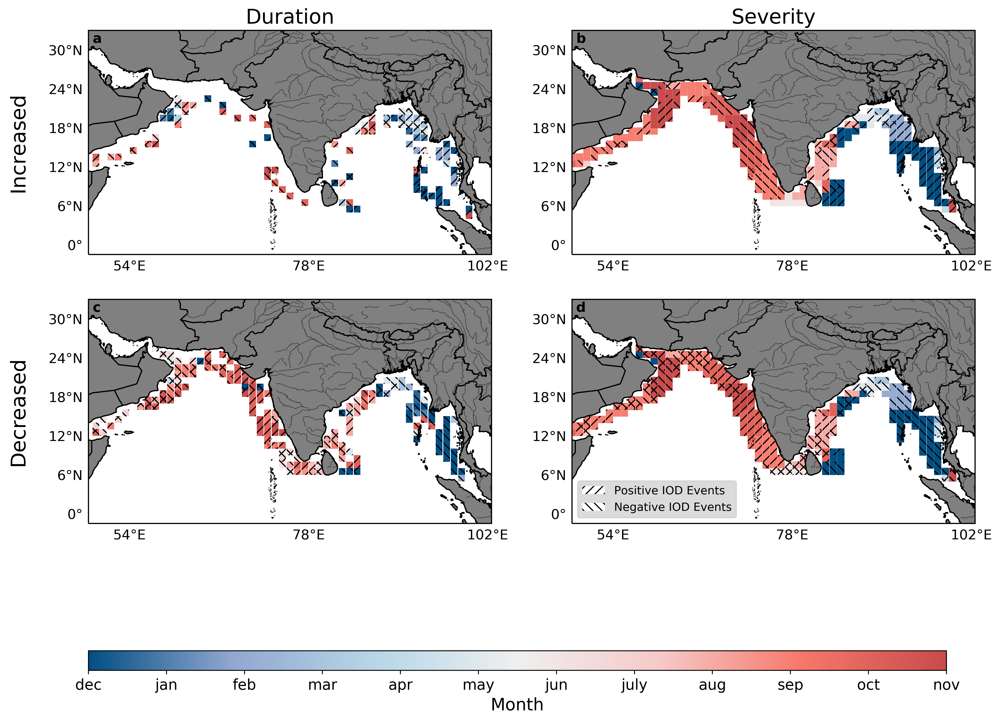

In [11]:
fig = plt.figure(figsize=(14,8),dpi=400)

sz = 30
fsz = 12
alpha = 0.25

cmin2 = 1
cmax2 = 12

cmap1 = get_continuous_cmap(['#000000','#7A378B','#42d4f4','#DcDcDc'],
                           [0,0.25,0.5,1])
cmap2 = get_continuous_cmap(['#034f84','#92a8d1','#b7d7e8','#f0f0f0','#f7cac9','#f7786b','#c94c4c'])

params = {'legend.fontsize': 14,
         'axes.labelsize': 15,
         'axes.titlesize': 18,
         'xtick.labelsize':13,
         'ytick.labelsize':13}

pylab.rcParams.update(params)

##############################################################
#           Likelihood
##############################################################

cmin1 = 0
cmax1 = 1

xx,yy = np.meshgrid(np.array(ds_WOA.lon),np.array(ds_WOA.lat))

mask = mask_coast(xx.flatten(),yy.flatten(),[35,120,-20,30])
mask.shape

xx = xx.flatten()[mask]
yy = yy.flatten()[mask]

var1 = zero_to_hyp.flatten()[mask]
var2p = inc_lkhd_p_mon.flatten()[mask]
var2n = inc_lkhd_n_mon.flatten()[mask]
var3p = dec_lkhd_p_mon.flatten()[mask]
var3n = dec_lkhd_n_mon.flatten()[mask]

# -----------------------------------------------------------

ax = fig.add_subplot(221,projection= ccrs.PlateCarree())
maskp = ~np.isnan(var2p)
ax.scatter(xx[maskp],yy[maskp],c = var2p[maskp],marker='s',
           s= sz+5,hatch = '///',edgecolor='black', linewidth=0,cmap=cmap2,vmin=cmin2,
           vmax=cmax2,transform=ccrs.PlateCarree())
maskn = ~np.isnan(var2n)
ax.scatter(xx[maskn],yy[maskn],c = var2n[maskn],marker='s',
           s= sz+5,hatch = '\\\\\\',edgecolor='black', linewidth=0,cmap=cmap2,vmin=cmin2,
           vmax=cmax2,transform=ccrs.PlateCarree())
masknp = maskp & maskn
ax.scatter(xx[masknp],yy[masknp],c = var2n[masknp],marker='s',
           s= sz+5,hatch = 'xxx',edgecolor='black', linewidth=0,cmap=cmap2,vmin=cmin2,
           vmax=cmax2,transform=ccrs.PlateCarree())
g = add_land(ax, countries = True, rivers = True, lakes = True)
g.xlocator = mticker.FixedLocator([54,78,102])
g.xlabel_style = {'size': 12}
g.ylabel_style = {'size': 12}
ax.set_title('Duration')
ylabel_map(ax,'Increased')
add_letter(ax, 'a')

# -----------------------------------------------------------

ax = fig.add_subplot(223,projection= ccrs.PlateCarree())
maskp = ~np.isnan(var3p)
ax.scatter(xx[maskp],yy[maskp],c = var3p[maskp],marker='s',
           s= sz+5,hatch ='///' ,edgecolor='black', linewidth=0,cmap=cmap2,vmin=cmin2,
           vmax=cmax2,transform=ccrs.PlateCarree())
maskn = ~np.isnan(var3n)
ax.scatter(xx[maskn],yy[maskn],c = var3n[maskn],marker='s',
           s= sz+5,hatch = '\\\\\\',edgecolor='black', linewidth=0,cmap=cmap2,vmin=cmin2,
           vmax=cmax2,transform=ccrs.PlateCarree())
masknp = maskp & maskn
ax.scatter(xx[masknp],yy[masknp],c = var3n[masknp],marker='s',
           s= sz+5,hatch = 'xxx',edgecolor='black', linewidth=0,cmap=cmap2,vmin=cmin2,
           vmax=cmax2,transform=ccrs.PlateCarree())
g = add_land(ax, countries = True, rivers = True, lakes = True)
g.xlocator = mticker.FixedLocator([54,78,102])
g.xlabel_style = {'size': 12}
g.ylabel_style = {'size': 12}
ylabel_map(ax,'Decreased')
add_letter(ax, 'c')

# -----------------------------------------------------------

##############################################################
#           Severity
##############################################################

cmin1 = severe_hyp_thres
cmax1 = hypoxic_thres

xx,yy = np.meshgrid(np.array(ds_WOA.lon),np.array(ds_WOA.lat))

mask = mask_coast(xx.flatten(),yy.flatten(),[35,120,-20,30])
mask.shape

xx = xx.flatten()[mask]
yy = yy.flatten()[mask]

var1 = min_mean.flatten()[mask]
var2 = min_mean_mon.flatten()[mask]
inc_sev_p_tmp = inc_sev_p.flatten()[mask]
inc_sev_n_tmp = inc_sev_n.flatten()[mask]
dec_sev_p_tmp = dec_sev_p.flatten()[mask]
dec_sev_n_tmp = dec_sev_n.flatten()[mask]
dec_sev_np_tmp = dec_sev_np.flatten()[mask]
inc_sev_np_tmp = inc_sev_np.flatten()[mask]

#only keep data that was hypoxic at one month
var_hyp = min_mean.flatten()[mask]
mask_hyp = var_hyp < cmax1

var1 = var1[mask_hyp]
var2 = var2[mask_hyp]
inc_sev_p_tmp = inc_sev_p_tmp[mask_hyp]
inc_sev_n_tmp = inc_sev_n_tmp[mask_hyp]
dec_sev_p_tmp = dec_sev_p_tmp[mask_hyp]
dec_sev_n_tmp = dec_sev_n_tmp[mask_hyp]
inc_sev_np_tmp = inc_sev_np_tmp[mask_hyp]
dec_sev_np_tmp = dec_sev_np_tmp[mask_hyp]
xx = xx[mask_hyp]
yy = yy[mask_hyp]

# -----------------------------------------------------------

ax = fig.add_subplot(222,projection= ccrs.PlateCarree())
ax.scatter(xx,yy,c = var2,marker='s',s= sz,
               cmap=cmap2,vmin=cmin2,vmax=cmax2,transform=ccrs.PlateCarree())
ax.scatter(xx[inc_sev_p_tmp],yy[inc_sev_p_tmp],c = var2[inc_sev_p_tmp],marker='s',
           s= sz+5,hatch = '///',edgecolor='black', linewidth=0,cmap=cmap2,
           vmin=cmin2,vmax=cmax2,transform=ccrs.PlateCarree())
ax.scatter(xx[inc_sev_n_tmp],yy[inc_sev_n_tmp],c = var2[inc_sev_n_tmp],marker='s',
           s= sz+5,hatch = '\\\\\\',edgecolor='black', linewidth=0,cmap=cmap2,
           vmin=cmin2,vmax=cmax2,transform=ccrs.PlateCarree())
ax.scatter(xx[inc_sev_np_tmp],yy[inc_sev_np_tmp],c = var2[inc_sev_np_tmp],marker='s',
           s=sz+5,hatch = 'xxx',edgecolor='black', linewidth=0,cmap=cmap2,
           vmin=cmin2,vmax=cmax2,transform=ccrs.PlateCarree())
g = add_land(ax,countries = True, rivers = True, lakes = True)
ax.set_title('Severity')
g.xlocator = mticker.FixedLocator([54,78,102])
g.xlabel_style = {'size': 12}
g.ylabel_style = {'size': 12}
add_letter(ax, 'b')

# -----------------------------------------------------------

ax = fig.add_subplot(224,projection= ccrs.PlateCarree())
p2 = ax.scatter(xx,yy,c = var2,marker='s',s= sz,
               cmap=cmap2,vmin=cmin2,vmax=cmax2,transform=ccrs.PlateCarree())
ax.scatter(xx[dec_sev_p_tmp],yy[dec_sev_p_tmp],c = var2[dec_sev_p_tmp],marker='s',
           s= sz+5,hatch = '///',edgecolor='black', linewidth=0,cmap=cmap2,
           vmin=cmin2,vmax=cmax2,transform=ccrs.PlateCarree())
ax.scatter(xx[dec_sev_n_tmp],yy[dec_sev_n_tmp],c = var2[dec_sev_n_tmp],marker='s',
           s= sz+5,hatch = '\\\\\\',edgecolor='black', linewidth=0,cmap=cmap2,
           vmin=cmin2,vmax=cmax2,transform=ccrs.PlateCarree())
ax.scatter(xx[dec_sev_np_tmp],yy[dec_sev_np_tmp],c = var2[dec_sev_np_tmp],
           marker='s',s= sz+5,hatch = 'xxx',edgecolor='black', linewidth=0,cmap=cmap2,
           vmin=cmin2,vmax=cmax2,transform=ccrs.PlateCarree())
g = add_land(ax, countries = True, rivers = True, lakes = True)
g.xlocator = mticker.FixedLocator([54,78,102])
g.xlabel_style = {'size': 12}
g.ylabel_style = {'size': 12}
add_letter(ax, 'd')

# -----------------------------------------------------------

import matplotlib.patches as mpatches

circ1 = mpatches.Patch(facecolor='w',hatch='///', label = 'Positive IOD Events')
circ2 = mpatches.Patch(facecolor='w',hatch='\\\\\\', label = 'Negative IOD Events')
circ3 = mpatches.Patch(facecolor='w',hatch='xxx', label = 'Negative IOD Events')

plt.legend(handles = [circ1,circ2],loc=3, ncol = 1, fontsize = 10, facecolor = 'lightgrey')

mon_title = ['dec','jan','feb','mar','apr','may','jun','july','aug','sep','oct','nov']
cbar_ax = fig.add_axes([0.125, -0.1, 0.75, 0.03])
cbar2 = fig.colorbar(p2,cax=cbar_ax, pad=0.04, orientation = 'horizontal',ticks = np.arange(1,13))
cbar2.set_label('Month')
cbar2.set_ticklabels(mon_title)

# season cbar
# seas_title = ['winter','spring','summer','fall']

# cbar_ax = fig.add_axes([0.4, -0.1, 0.5, 0.06])
# cbar2 = fig.colorbar(p2,cax=cbar_ax, pad=0.04, orientation = 'horizontal',ticks = np.arange(1,4))
# cbar2.set_label('Season')
# cbar2.set_ticklabels(seas_title)


In [ ]:
# change month to season

/home/jennap/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:171: RuntimeWarning: invalid value encountered in less


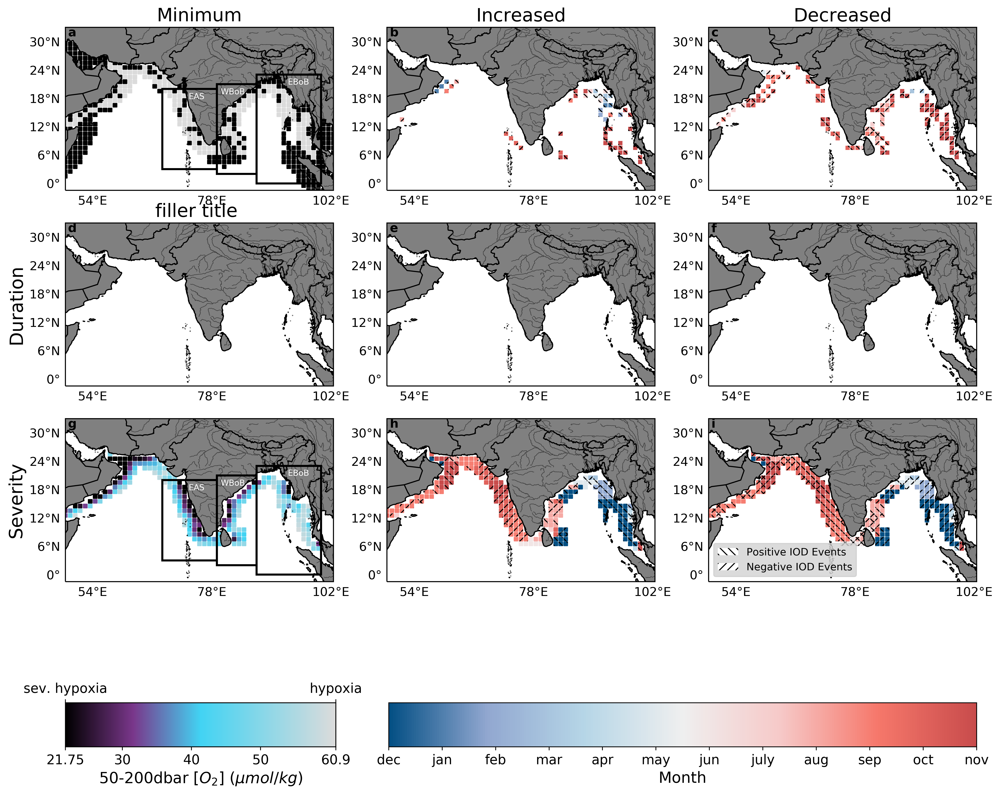

In [33]:
fig = plt.figure(figsize=(16,10),dpi=400)

sz = 12
sq_sz = 80
fsz = 12
alpha = 0.25

cmin2 = 1
cmax2 = 12

cmap1 = get_continuous_cmap(['#000000','#7A378B','#42d4f4','#DcDcDc'],
                           [0,0.25,0.5,1])
cmap2 = get_continuous_cmap(['#034f84','#92a8d1','#b7d7e8','#f0f0f0','#f7cac9','#f7786b','#c94c4c'])

params = {'legend.fontsize': 14,
         'axes.labelsize': 15,
         'axes.titlesize': 18,
         'xtick.labelsize':13,
         'ytick.labelsize':13}

pylab.rcParams.update(params)

##############################################################
#           Likelihood
##############################################################

cmin1 = 0
cmax1 = 1

xx,yy = np.meshgrid(np.array(ds_WOA.lon),np.array(ds_WOA.lat))

mask = mask_coast(xx.flatten(),yy.flatten(),[35,120,-20,30])
mask.shape

xx = xx.flatten()[mask]
yy = yy.flatten()[mask]

var1 = zero_to_hyp.flatten()[mask]
var2p = inc_lkhd_p_mon.flatten()[mask]
var2n = inc_lkhd_n_mon.flatten()[mask]
var3p = dec_lkhd_p_mon.flatten()[mask]
var3n = dec_lkhd_n_mon.flatten()[mask]

# -----------------------------------------------------------

ax = fig.add_subplot(331,projection= ccrs.PlateCarree())
p1 = ax.scatter(xx,yy,c = var1,marker='s',s= sz,
               cmap=cmap1,vmin=cmin1,vmax=cmax1,transform=ccrs.PlateCarree())
ax.set_title(title[0])
# AS and BoB Boxes
box_bounds = [bounds_AS,
         bounds_wBoB,
         bounds_BoB]  #lonmin,lonmax, latmin, latmax 
clrs = ['k','k','k']
g = add_land(ax, countries = True, rivers = True, lakes = True)
g.xlocator = mticker.FixedLocator([54,78,102])
g.xlabel_style = {'size': 12}
g.ylabel_style = {'size': 12}
add_box(ax,box_bounds,clrs)
add_text(ax, 'EAS', x = 0.46,y=0.56, fontsize = 8, color = 'w')
add_text(ax, 'WBoB', x = 0.58,y=0.59, fontsize = 8, color = 'w')
add_text(ax, 'EBoB', x = 0.83,y=0.65, fontsize = 8, color = 'w')
add_letter(ax, 'a')

# -----------------------------------------------------------

ax = fig.add_subplot(332,projection= ccrs.PlateCarree())
maskp = ~np.isnan(var2p)
ax.scatter(xx[maskp],yy[maskp],c = var2p[maskp],marker='s',
           s= sz+5,hatch = '\\\\\\',edgecolor='black', linewidth=0,cmap=cmap2,vmin=cmin2,
           vmax=cmax2,transform=ccrs.PlateCarree())
maskn = ~np.isnan(var2n)
ax.scatter(xx[maskn],yy[maskn],c = var2n[maskn],marker='s',
           s= sz+5,hatch = '///',edgecolor='black', linewidth=0,cmap=cmap2,vmin=cmin2,
           vmax=cmax2,transform=ccrs.PlateCarree())
masknp = maskp & maskn
ax.scatter(xx[masknp],yy[masknp],c = var2n[masknp],marker='s',
           s= sz+5,hatch = 'xxx',edgecolor='black', linewidth=0,cmap=cmap2,vmin=cmin2,
           vmax=cmax2,transform=ccrs.PlateCarree())
g = add_land(ax, countries = True, rivers = True, lakes = True)
g.xlocator = mticker.FixedLocator([54,78,102])
g.xlabel_style = {'size': 12}
g.ylabel_style = {'size': 12}
ax.set_title('Increased')
add_letter(ax, 'b')

# -----------------------------------------------------------

ax = fig.add_subplot(333,projection= ccrs.PlateCarree())
maskp = ~np.isnan(var3p)
ax.scatter(xx[maskp],yy[maskp],c = var3p[maskp],marker='s',
           s= sz+5,hatch = '\\\\\\',edgecolor='black', linewidth=0,cmap=cmap2,vmin=cmin2,
           vmax=cmax2,transform=ccrs.PlateCarree())
maskn = ~np.isnan(var3n)
ax.scatter(xx[maskn],yy[maskn],c = var3n[maskn],marker='s',
           s= sz+5,hatch = '///',edgecolor='black', linewidth=0,cmap=cmap2,vmin=cmin2,
           vmax=cmax2,transform=ccrs.PlateCarree())
masknp = maskp & maskn
ax.scatter(xx[masknp],yy[masknp],c = var3n[masknp],marker='s',
           s= sz+5,hatch = 'xxx',edgecolor='black', linewidth=0,cmap=cmap2,vmin=cmin2,
           vmax=cmax2,transform=ccrs.PlateCarree())
g = add_land(ax, countries = True, rivers = True, lakes = True)
g.xlocator = mticker.FixedLocator([54,78,102])
g.xlabel_style = {'size': 12}
g.ylabel_style = {'size': 12}
ax.set_title('Decreased')
add_letter(ax, 'c')

# -----------------------------------------------------------

##############################################################
#           Duration   
##############################################################

ax = fig.add_subplot(334,projection= ccrs.PlateCarree())
g = add_land(ax, countries = True, rivers = True, lakes = True)
g.xlocator = mticker.FixedLocator([54,78,102])
g.xlabel_style = {'size': 12}
g.ylabel_style = {'size': 12}
ylabel_map(ax,'Duration')
ax.set_title('filler title ')
add_letter(ax, 'd')

# -----------------------------------------------------------

ax = fig.add_subplot(335,projection= ccrs.PlateCarree())
g = add_land(ax, countries = True, rivers = True, lakes = True)
g.xlocator = mticker.FixedLocator([54,78,102])
g.xlabel_style = {'size': 12}
g.ylabel_style = {'size': 12}
add_letter(ax, 'e')

# -----------------------------------------------------------

ax = fig.add_subplot(336,projection= ccrs.PlateCarree())
g = add_land(ax, countries = True, rivers = True, lakes = True)
g.xlocator = mticker.FixedLocator([54,78,102])
g.xlabel_style = {'size': 12}
g.ylabel_style = {'size': 12}

add_letter(ax, 'f')

# -----------------------------------------------------------

##############################################################
#           Severity
##############################################################

cmin1 = severe_hyp_thres
cmax1 = hypoxic_thres

xx,yy = np.meshgrid(np.array(ds_WOA.lon),np.array(ds_WOA.lat))

mask = mask_coast(xx.flatten(),yy.flatten(),[35,120,-20,30])
mask.shape

xx = xx.flatten()[mask]
yy = yy.flatten()[mask]

var1 = min_mean.flatten()[mask]
var2 = min_mean_mon.flatten()[mask]
inc_sev_p_tmp = inc_sev_p.flatten()[mask]
inc_sev_n_tmp = inc_sev_n.flatten()[mask]
dec_sev_p_tmp = dec_sev_p.flatten()[mask]
dec_sev_n_tmp = dec_sev_n.flatten()[mask]
dec_sev_np_tmp = dec_sev_np.flatten()[mask]
inc_sev_np_tmp = inc_sev_np.flatten()[mask]

#only keep data that was hypoxic at one month
var_hyp = min_mean.flatten()[mask]
mask_hyp = var_hyp < cmax1

var1 = var1[mask_hyp]
var2 = var2[mask_hyp]
inc_sev_p_tmp = inc_sev_p_tmp[mask_hyp]
inc_sev_n_tmp = inc_sev_n_tmp[mask_hyp]
dec_sev_p_tmp = dec_sev_p_tmp[mask_hyp]
dec_sev_n_tmp = dec_sev_n_tmp[mask_hyp]
inc_sev_np_tmp = inc_sev_np_tmp[mask_hyp]
dec_sev_np_tmp = dec_sev_np_tmp[mask_hyp]
xx = xx[mask_hyp]
yy = yy[mask_hyp]

# -----------------------------------------------------------

ax = fig.add_subplot(337,projection= ccrs.PlateCarree())
p1 = ax.scatter(xx,yy,c = var1,marker='s',s= sz,
               cmap=cmap1,vmin=cmin1,vmax=cmax1,transform=ccrs.PlateCarree())
ylabel_map(ax,'Severity')
# AS and BoB Boxes
box_bounds = [bounds_AS,
         bounds_wBoB,
         bounds_BoB]  #lonmin,lonmax, latmin, latmax 
clrs = ['k','k','k']
g = add_land(ax, countries = True, rivers = True, lakes = True)
g.xlocator = mticker.FixedLocator([54,78,102])
g.xlabel_style = {'size': 12}
g.ylabel_style = {'size': 12}
add_box(ax,box_bounds,clrs)
add_text(ax, 'EAS', x = 0.46,y=0.56, fontsize = 8, color = 'w')
add_text(ax, 'WBoB', x = 0.58,y=0.59, fontsize = 8, color = 'w')
add_text(ax, 'EBoB', x = 0.83,y=0.65, fontsize = 8, color = 'w')
add_letter(ax, 'g')

# -----------------------------------------------------------

ax = fig.add_subplot(338,projection= ccrs.PlateCarree())
ax.scatter(xx,yy,c = var2,marker='s',s= sz,
               cmap=cmap2,vmin=cmin2,vmax=cmax2,transform=ccrs.PlateCarree())
ax.scatter(xx[inc_sev_p_tmp],yy[inc_sev_p_tmp],c = var2[inc_sev_p_tmp],marker='s',s= sz+5,hatch = '\\\\\\',
                      edgecolor='black', linewidth=0,cmap=cmap2,vmin=cmin2,vmax=cmax2,transform=ccrs.PlateCarree())
ax.scatter(xx[inc_sev_n_tmp],yy[inc_sev_n_tmp],c = var2[inc_sev_n_tmp],marker='s',s= sz+5,hatch = '///',
                      edgecolor='black', linewidth=0,cmap=cmap2,vmin=cmin2,vmax=cmax2,transform=ccrs.PlateCarree())
ax.scatter(xx[inc_sev_np_tmp],yy[inc_sev_np_tmp],c = var2[inc_sev_np_tmp],marker='s',s=sz+5,hatch = 'xxx',
                      edgecolor='black', linewidth=0,cmap=cmap2,vmin=cmin2,vmax=cmax2,transform=ccrs.PlateCarree())
g = add_land(ax,countries = True, rivers = True, lakes = True)
g.xlocator = mticker.FixedLocator([54,78,102])
g.xlabel_style = {'size': 12}
g.ylabel_style = {'size': 12}
add_letter(ax, 'h')

# -----------------------------------------------------------

ax = fig.add_subplot(339,projection= ccrs.PlateCarree())
p2 = ax.scatter(xx,yy,c = var2,marker='s',s= sz,
               cmap=cmap2,vmin=cmin2,vmax=cmax2,transform=ccrs.PlateCarree())
ax.scatter(xx[dec_sev_p_tmp],yy[dec_sev_p_tmp],c = var2[dec_sev_p_tmp],marker='s',s= sz+5,hatch = '\\\\\\',
                      edgecolor='black', linewidth=0,cmap=cmap2,vmin=cmin2,vmax=cmax2,transform=ccrs.PlateCarree())
ax.scatter(xx[dec_sev_n_tmp],yy[dec_sev_n_tmp],c = var2[dec_sev_n_tmp],marker='s',s= sz+5,hatch = '///',
                      edgecolor='black', linewidth=0,cmap=cmap2,vmin=cmin2,vmax=cmax2,transform=ccrs.PlateCarree())
ax.scatter(xx[dec_sev_np_tmp],yy[dec_sev_np_tmp],c = var2[dec_sev_np_tmp],marker='s',s= sz+5,hatch = 'xxx',
                      edgecolor='black', linewidth=0,cmap=cmap2,vmin=cmin2,vmax=cmax2,transform=ccrs.PlateCarree())
g = add_land(ax, countries = True, rivers = True, lakes = True)
g.xlocator = mticker.FixedLocator([54,78,102])
g.xlabel_style = {'size': 12}
g.ylabel_style = {'size': 12}
add_letter(ax, 'i')

# -----------------------------------------------------------

import matplotlib.patches as mpatches

circ1 = mpatches.Patch(facecolor='w',hatch='\\\\\\', label = 'Positive IOD Events')
circ2 = mpatches.Patch(facecolor='w',hatch='///', label = 'Negative IOD Events')
circ3 = mpatches.Patch(facecolor='w',hatch='xxx', label = 'Negative IOD Events')

plt.legend(handles = [circ1,circ2],loc=3, ncol = 1, fontsize = 10, facecolor = 'lightgrey')


cbar_ax = fig.add_axes([0.125, -0.1, 0.23, 0.06])
cbar_ax2 = cbar_ax.twiny()
# cbar = fig.colorbar(p1,cax=cbar_ax, pad=0.04, orientation = 'horizontal',
#                    ticks = [4.35,21.75,60.9])
# cbar.set_ticklabels(['suboxia','sev. hypoxia','hypoxia'])
cbar = fig.colorbar(p1,cax=cbar_ax, pad=0.04, orientation = 'horizontal',
                   ticks = [21.75,30,40,50,60.9])
cbar.set_ticklabels(['21.75','30','40','50','60.9'])
cbar_ax2.set_xticks([0,1])
cbar_ax2.set_xticklabels(['sev. hypoxia','hypoxia'])
# cbar.ax.xaxis.set_ticks_position("top")
cbar.set_label('50-200dbar [$O_2$] ($\mu mol/ kg$)')


# season cbar
# seas_title = ['winter','spring','summer','fall']

# cbar_ax = fig.add_axes([0.4, -0.1, 0.5, 0.06])
# cbar2 = fig.colorbar(p2,cax=cbar_ax, pad=0.04, orientation = 'horizontal',ticks = np.arange(1,4))
# cbar2.set_label('Season')
# cbar2.set_ticklabels(seas_title)

mon_title = ['dec','jan','feb','mar','apr','may','jun','july','aug','sep','oct','nov']
cbar_ax = fig.add_axes([0.4, -0.1, 0.5, 0.06])
cbar2 = fig.colorbar(p2,cax=cbar_ax, pad=0.04, orientation = 'horizontal',ticks = np.arange(1,13))
# cbar2.ax.xaxis.set_ticks_position("top")
cbar2.set_label('Month')
cbar2.set_ticklabels(mon_title)



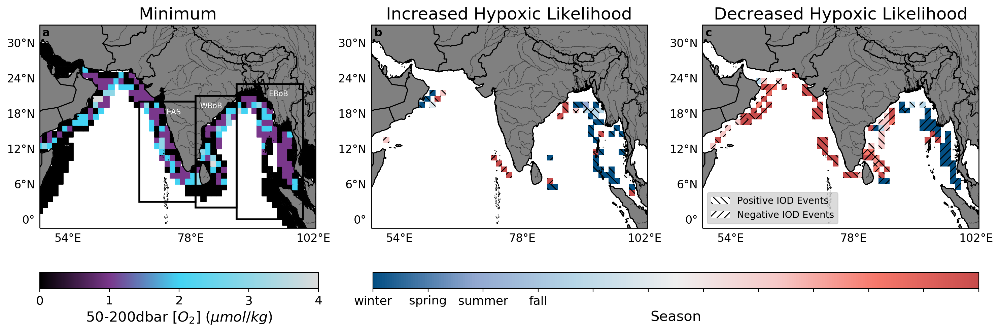

In [32]:
fig = plt.figure(figsize=(18,4),dpi=200)

sz = 35
fsz = 8

cmin1 = 0
cmax1 = 4

cmin2 = 1
cmax2 = 4

cmap1 = get_continuous_cmap(['#000000','#7A378B','#42d4f4','#DcDcDc'],
                           [0,0.25,0.5,1])
# cmap1 = get_continuous_cmap(['#000000','#7A378B','#42d4f4','#DcDcDc'],
#                            [0,0.3,0.9,1])
cmap2 = get_continuous_cmap(['#034f84','#92a8d1','#b7d7e8','#f0f0f0','#f7cac9','#f7786b','#c94c4c'])



plt.rcParams.update({'legend.fontsize': 16,
                     'legend.handlelength': 2,
                     "legend.markerscale":2,
                     'font.size': 12})

title = ['Minimum','Increased Hypoxic Likelihood', 'Decreased Hypoxic Likelihood']
seas_title = ['winter','spring','summer','fall']
# mon_title = ['jun','july','aug','sep','oct','nov','dec','jan','feb','mar','apr','may']



xx,yy = np.meshgrid(np.array(ds_WOA.lon),np.array(ds_WOA.lat))

mask = mask_coast(xx.flatten(),yy.flatten(),[35,120,-20,30])
mask.shape

xx = xx.flatten()[mask]
yy = yy.flatten()[mask]

var1 = zero_to_hyp.flatten()[mask]
var2p = inc_lkhd_p_seas.flatten()[mask]
var2n = inc_lkhd_n_seas.flatten()[mask]
var3p = dec_lkhd_p_seas.flatten()[mask]
var3n = dec_lkhd_n_seas.flatten()[mask]
inc_lkhd_p_tmp = inc_lkhd_p.flatten()[mask]
inc_lkhd_n_tmp = inc_lkhd_n.flatten()[mask]
dec_lkhd_p_tmp = dec_lkhd_p.flatten()[mask]
dec_lkhd_n_tmp = dec_lkhd_n.flatten()[mask]
dec_lkhd_np_tmp = dec_lkhd_np.flatten()[mask]
inc_lkhd_np_tmp = inc_lkhd_np.flatten()[mask]

##############################################################
ax = fig.add_subplot(131,projection= ccrs.PlateCarree())

p1 = ax.scatter(xx,yy,c = var1,marker='s',s= sz,
               cmap=cmap1,vmin=cmin1,vmax=cmax1,transform=ccrs.PlateCarree())
ax.set_title(title[0])
# AS and BoB Boxes
box_bounds = [bounds_AS,
         bounds_wBoB,
         bounds_BoB]  #lonmin,lonmax, latmin, latmax 
clrs = ['k','k','k']
g = add_land(ax, countries = True, rivers = True, lakes = True)
g.xlocator = mticker.FixedLocator([54,78,102])
g.xlabel_style = {'size': 12}
g.ylabel_style = {'size': 12}
add_box(ax,box_bounds,clrs)
add_text(ax, 'EAS', x = 0.46,y=0.56, fontsize = 8, color = 'w')
add_text(ax, 'WBoB', x = 0.58,y=0.59, fontsize = 8, color = 'w')
add_text(ax, 'EBoB', x = 0.83,y=0.65, fontsize = 8, color = 'w')
add_letter(ax, 'a')


ax = fig.add_subplot(132,projection= ccrs.PlateCarree())
# ax.scatter(xx,yy,c = var2p,marker='s',s= sz,
#                cmap=cmap2,vmin=cmin2,vmax=cmax2,transform=ccrs.PlateCarree())
# ax.scatter(xx,yy,c = var2n,marker='s',s= sz,
#                cmap=cmap2,vmin=cmin2,vmax=cmax2,transform=ccrs.PlateCarree())
maskp = ~np.isnan(var2p)
ax.scatter(xx[maskp],yy[maskp],c = var2p[maskp],marker='s',
           s= sz+5,hatch = '\\\\\\',edgecolor='black', linewidth=0,cmap=cmap2,vmin=cmin2,
           vmax=cmax2,transform=ccrs.PlateCarree())
maskn = ~np.isnan(var2n)
ax.scatter(xx[maskn],yy[maskn],c = var2n[maskn],marker='s',
           s= sz+5,hatch = '///',edgecolor='black', linewidth=0,cmap=cmap2,vmin=cmin2,
           vmax=cmax2,transform=ccrs.PlateCarree())
masknp = maskp & maskn
ax.scatter(xx[masknp],yy[masknp],c = var2n[masknp],marker='s',
           s= sz+5,hatch = 'xxx',edgecolor='black', linewidth=0,cmap=cmap2,vmin=cmin2,
           vmax=cmax2,transform=ccrs.PlateCarree())
g = add_land(ax, countries = True, rivers = True, lakes = True)
g.xlocator = mticker.FixedLocator([54,78,102])
g.xlabel_style = {'size': 12}
g.ylabel_style = {'size': 12}
ax.set_title(title[1])
add_letter(ax, 'b')


ax = fig.add_subplot(133,projection= ccrs.PlateCarree())
# p2 = ax.scatter(xx,yy,c = var3p,marker='s',s= sz,
#                cmap=cmap2,vmin=cmin2,vmax=cmax2,transform=ccrs.PlateCarree())
maskp = ~np.isnan(var3p)
ax.scatter(xx[maskp],yy[maskp],c = var3p[maskp],marker='s',
           s= sz+5,hatch = '\\\\\\',edgecolor='black', linewidth=0,cmap=cmap2,vmin=cmin2,
           vmax=cmax2,transform=ccrs.PlateCarree())
maskn = ~np.isnan(var3n)
ax.scatter(xx[maskn],yy[maskn],c = var3n[maskn],marker='s',
           s= sz+5,hatch = '///',edgecolor='black', linewidth=0,cmap=cmap2,vmin=cmin2,
           vmax=cmax2,transform=ccrs.PlateCarree())
masknp = maskp & maskn
ax.scatter(xx[masknp],yy[masknp],c = var3n[masknp],marker='s',
           s= sz+5,hatch = 'xxx',edgecolor='black', linewidth=0,cmap=cmap2,vmin=cmin2,
           vmax=cmax2,transform=ccrs.PlateCarree())
g = add_land(ax, countries = True, rivers = True, lakes = True)
g.xlocator = mticker.FixedLocator([54,78,102])
g.xlabel_style = {'size': 12}
g.ylabel_style = {'size': 12}
ax.set_title(title[2])
add_letter(ax, 'c')

import matplotlib.patches as mpatches

circ1 = mpatches.Patch(facecolor='w',hatch='\\\\\\', label = 'Positive IOD Events')
circ2 = mpatches.Patch(facecolor='w',hatch='///', label = 'Negative IOD Events')
circ3 = mpatches.Patch(facecolor='w',hatch='xxx', label = 'Negative IOD Events')

plt.legend(handles = [circ1,circ2],loc=3, ncol = 1, fontsize = 10, facecolor = 'lightgrey')


cbar_ax = fig.add_axes([0.125, -0.1, 0.23, 0.06])
# cbar_ax2 = cbar_ax.twiny()
cbar = fig.colorbar(p1,cax=cbar_ax, pad=0.04, orientation = 'horizontal',
                   ticks = [0,1,2,3,4])
# cbar.set_ticklabels(['21.75','30','40','50','60.9'])
# cbar_ax2.set_xticks([0,1])
# cbar_ax2.set_xticklabels(['sev. hypoxia','hypoxia'])
# cbar.ax.xaxis.set_ticks_position("bottom")
cbar.set_label('50-200dbar [$O_2$] ($\mu mol/ kg$)')


cbar_ax = fig.add_axes([0.4, -0.1, 0.5, 0.06])
cbar2 = fig.colorbar(p2,cax=cbar_ax, pad=0.04, orientation = 'horizontal',ticks = np.arange(1,13))
# cbar2.ax.xaxis.set_ticks_position("top")
cbar2.set_label('Season')
cbar2.set_ticklabels(seas_title)





/home/jennap/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:55: RuntimeWarning: invalid value encountered in less


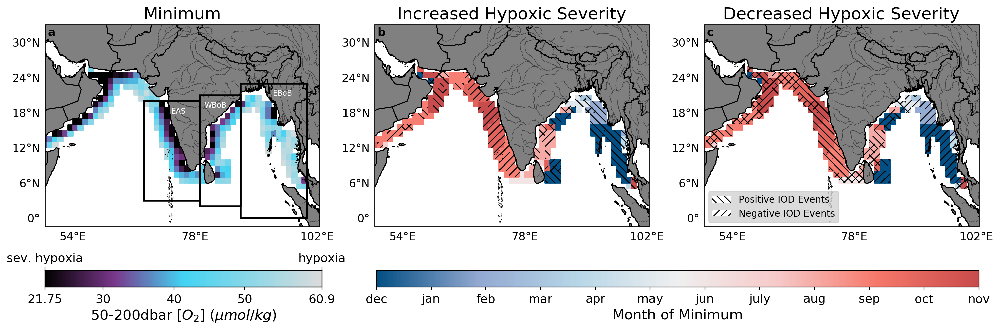

In [47]:
fig = plt.figure(figsize=(18,4),dpi=200)

hypoxic_thres = 60.9
severe_hyp_thres = 21.75
suboxia_thres = 4.35

sz = 35
fsz = 8

cmin1 = severe_hyp_thres
cmax1 = hypoxic_thres

cmin2 = 1
cmax2 = 12

cmap1 = get_continuous_cmap(['#000000','#7A378B','#42d4f4','#DcDcDc'],
                           [0,0.25,0.5,1])
# cmap1 = get_continuous_cmap(['#000000','#7A378B','#42d4f4','#DcDcDc'],
#                            [0,0.3,0.9,1])
cmap2 = get_continuous_cmap(['#034f84','#92a8d1','#b7d7e8','#f0f0f0','#f7cac9','#f7786b','#c94c4c'])

cbounds = [48.5,102.5,-1.5,33]


plt.rcParams.update({'legend.fontsize': 16,
                     'legend.handlelength': 2,
                     "legend.markerscale":2,
                     'font.size': 12})

title = ['Minimum','Increased Hypoxic Severity', 'Decreased Hypoxic Severity']
mon_title = ['dec','jan','feb','mar','apr','may','jun','july','aug','sep','oct','nov']
# mon_title = ['jun','july','aug','sep','oct','nov','dec','jan','feb','mar','apr','may']



xx,yy = np.meshgrid(np.array(ds_WOA.lon),np.array(ds_WOA.lat))

mask = mask_coast(xx.flatten(),yy.flatten(),[35,120,-20,30])
mask.shape

xx = xx.flatten()[mask]
yy = yy.flatten()[mask]

var1 = min_mean.flatten()[mask]
var2 = min_mean_mon.flatten()[mask]
inc_sev_p_tmp = inc_sev_p.flatten()[mask]
inc_sev_n_tmp = inc_sev_n.flatten()[mask]
dec_sev_p_tmp = dec_sev_p.flatten()[mask]
dec_sev_n_tmp = dec_sev_n.flatten()[mask]
dec_sev_np_tmp = dec_sev_np.flatten()[mask]
inc_sev_np_tmp = inc_sev_np.flatten()[mask]

#only keep data that was hypoxic at one month
var_hyp = min_mean.flatten()[mask]
mask_hyp = var_hyp < cmax1

var1 = var1[mask_hyp]
var2 = var2[mask_hyp]
inc_sev_p_tmp = inc_sev_p_tmp[mask_hyp]
inc_sev_n_tmp = inc_sev_n_tmp[mask_hyp]
dec_sev_p_tmp = dec_sev_p_tmp[mask_hyp]
dec_sev_n_tmp = dec_sev_n_tmp[mask_hyp]
inc_sev_np_tmp = inc_sev_np_tmp[mask_hyp]
dec_sev_np_tmp = dec_sev_np_tmp[mask_hyp]
xx = xx[mask_hyp]
yy = yy[mask_hyp]

# hatch data where risk
# hatch_var_piod



##############################################################
ax = fig.add_subplot(131,projection= ccrs.PlateCarree())
p1 = ax.scatter(xx,yy,c = var1,marker='s',s= sz,
               cmap=cmap1,vmin=cmin1,vmax=cmax1,transform=ccrs.PlateCarree())
ax.set_title(title[0])
# AS and BoB Boxes
box_bounds = [bounds_AS,
         bounds_wBoB,
         bounds_BoB]  #lonmin,lonmax, latmin, latmax 
clrs = ['k','k','k']
g = add_land(ax, cbounds, countries = True, rivers = True, lakes = True)
g.xlocator = mticker.FixedLocator([54,78,102])
g.xlabel_style = {'size': 12}
g.ylabel_style = {'size': 12}
add_box(ax,box_bounds,clrs)
add_text(ax, 'EAS', x = 0.46,y=0.56, fontsize = 8, color = 'w')
add_text(ax, 'WBoB', x = 0.58,y=0.59, fontsize = 8, color = 'w')
add_text(ax, 'EBoB', x = 0.83,y=0.65, fontsize = 8, color = 'w')
add_letter(ax, 'a')


ax = fig.add_subplot(132,projection= ccrs.PlateCarree())
ax.scatter(xx,yy,c = var2,marker='s',s= sz,
               cmap=cmap2,vmin=cmin2,vmax=cmax2,transform=ccrs.PlateCarree())
ax.scatter(xx[inc_sev_p_tmp],yy[inc_sev_p_tmp],c = var2[inc_sev_p_tmp],marker='s',s= sz+5,hatch = '\\\\\\',
                      edgecolor='black', linewidth=0,cmap=cmap2,vmin=cmin2,vmax=cmax2,transform=ccrs.PlateCarree())
ax.scatter(xx[inc_sev_n_tmp],yy[inc_sev_n_tmp],c = var2[inc_sev_n_tmp],marker='s',s= sz+5,hatch = '///',
                      edgecolor='black', linewidth=0,cmap=cmap2,vmin=cmin2,vmax=cmax2,transform=ccrs.PlateCarree())
ax.scatter(xx[inc_sev_np_tmp],yy[inc_sev_np_tmp],c = var2[inc_sev_np_tmp],marker='s',s=sz+5,hatch = 'xxx',
                      edgecolor='black', linewidth=0,cmap=cmap2,vmin=cmin2,vmax=cmax2,transform=ccrs.PlateCarree())
g = add_land(ax, cbounds, countries = True, rivers = True, lakes = True)
g.xlocator = mticker.FixedLocator([54,78,102])
g.xlabel_style = {'size': 12}
g.ylabel_style = {'size': 12}
ax.set_title(title[1])
add_letter(ax, 'b')


ax = fig.add_subplot(133,projection= ccrs.PlateCarree())
p2 = ax.scatter(xx,yy,c = var2,marker='s',s= sz,
               cmap=cmap2,vmin=cmin2,vmax=cmax2,transform=ccrs.PlateCarree())
ax.scatter(xx[dec_sev_p_tmp],yy[dec_sev_p_tmp],c = var2[dec_sev_p_tmp],marker='s',s= sz+5,hatch = '\\\\\\',
                      edgecolor='black', linewidth=0,cmap=cmap2,vmin=cmin2,vmax=cmax2,transform=ccrs.PlateCarree())
ax.scatter(xx[dec_sev_n_tmp],yy[dec_sev_n_tmp],c = var2[dec_sev_n_tmp],marker='s',s= sz+5,hatch = '///',
                      edgecolor='black', linewidth=0,cmap=cmap2,vmin=cmin2,vmax=cmax2,transform=ccrs.PlateCarree())
ax.scatter(xx[dec_sev_np_tmp],yy[dec_sev_np_tmp],c = var2[dec_sev_np_tmp],marker='s',s= sz+5,hatch = 'xxx',
                      edgecolor='black', linewidth=0,cmap=cmap2,vmin=cmin2,vmax=cmax2,transform=ccrs.PlateCarree())
g = add_land(ax, cbounds, countries = True, rivers = True, lakes = True)
g.xlocator = mticker.FixedLocator([54,78,102])
g.xlabel_style = {'size': 12}
g.ylabel_style = {'size': 12}
ax.set_title(title[2])
add_letter(ax, 'c')

import matplotlib.patches as mpatches

circ1 = mpatches.Patch(facecolor='w',hatch='\\\\\\', label = 'Positive IOD Events')
circ2 = mpatches.Patch(facecolor='w',hatch='///', label = 'Negative IOD Events')
circ3 = mpatches.Patch(facecolor='w',hatch='xxx', label = 'Negative IOD Events')

plt.legend(handles = [circ1,circ2],loc=3, ncol = 1, fontsize = 10, facecolor = 'lightgrey')


cbar_ax = fig.add_axes([0.125, -0.1, 0.23, 0.06])
cbar_ax2 = cbar_ax.twiny()
# cbar = fig.colorbar(p1,cax=cbar_ax, pad=0.04, orientation = 'horizontal',
#                    ticks = [4.35,21.75,60.9])
# cbar.set_ticklabels(['suboxia','sev. hypoxia','hypoxia'])
cbar = fig.colorbar(p1,cax=cbar_ax, pad=0.04, orientation = 'horizontal',
                   ticks = [21.75,30,40,50,60.9])
cbar.set_ticklabels(['21.75','30','40','50','60.9'])
cbar_ax2.set_xticks([0,1])
cbar_ax2.set_xticklabels(['sev. hypoxia','hypoxia'])
# cbar.ax.xaxis.set_ticks_position("top")
cbar.set_label('50-200dbar [$O_2$] ($\mu mol/ kg$)')


cbar_ax = fig.add_axes([0.4, -0.1, 0.5, 0.06])
cbar2 = fig.colorbar(p2,cax=cbar_ax, pad=0.04, orientation = 'horizontal',ticks = np.arange(1,13))
# cbar2.ax.xaxis.set_ticks_position("top")
cbar2.set_label('Month of Minimum')
cbar2.set_ticklabels(mon_title)




In [ ]:
# # thresholds
# sla_thresh = [0.03, 0.03, 0.03] # AS, wBoB, BoB

# hyp_thresh = 60.9
# sev_hyp_thresh = 21.75
# subox_thres = 4.35

# # intialize
# mons = np.arange(1,13)

# min_mean = np.full([len(ds_WOA.lat),len(ds_WOA.lon)],np.nan)
# min_mean_mon = np.full([len(ds_WOA.lat),len(ds_WOA.lon)],np.nan)
# min_mean_mon_SLA = np.full([len(ds_WOA.lat),len(ds_WOA.lon)],np.nan)

# inc_lkhd_p_AS = np.full([12,doxy_AS.shape[1]],False)
# inc_lkhd_n_AS = np.full([12,doxy_AS.shape[1]],False)
# dec_lkhd_p_AS = np.full([12,doxy_AS.shape[1]],False)
# dec_lkhd_n_AS = np.full([12,doxy_AS.shape[1]],False)

# inc_lkhd_p_wBoB = np.full([12,doxy_wBoB.shape[1]],False)
# inc_lkhd_n_wBoB = np.full([12,doxy_wBoB.shape[1]],False)
# dec_lkhd_p_wBoB = np.full([12,doxy_wBoB.shape[1]],False)
# dec_lkhd_n_wBoB = np.full([12,doxy_wBoB.shape[1]],False)

# inc_lkhd_p_BoB = np.full([12,doxy_BoB.shape[1]],False)
# inc_lkhd_n_BoB = np.full([12,doxy_BoB.shape[1]],False)
# dec_lkhd_p_BoB = np.full([12,doxy_BoB.shape[1]],False)
# dec_lkhd_n_BoB = np.full([12,doxy_BoB.shape[1]],False)

# # make lists of these vars for efficient looping
# doxy_vars = [doxy_AS, doxy_wBoB, doxy_BoB]# AS, wBoB, BoB
# posIODsla = [posIODsla_AS, posIODsla_wBoB,posIODsla_BoB]
# negIODsla = [negIODsla_AS, negIODsla_wBoB, negIODsla_BoB]
# inc_lkhd_p_vars = [inc_lkhd_p_AS,inc_lkhd_p_wBoB,inc_lkhd_p_BoB]
# inc_lkhd_n_vars = [inc_lkhd_n_AS,inc_lkhd_n_wBoB,inc_lkhd_n_BoB]
# dec_lkhd_p_vars = [dec_lkhd_p_AS,dec_lkhd_p_wBoB,dec_lkhd_p_BoB ]
# dec_lkhd_n_vars = [dec_lkhd_n_AS,dec_lkhd_n_wBoB,dec_lkhd_n_BoB]

# for ll in range(3):
    
#     doxy = doxy_vars[ll]
#     psla = posIODsla[ll]
#     nsla = negIODsla[ll]
        
#     # Find the no of times out of the year doxy falls into a given range
#     for mm,pos in itertools.product(np.arange(12),np.arange(doxy.shape[1])):
#         doxy_tmp = doxy[mm,pos]
#         psla_tmp = psla[mm,pos]
#         nsla_tmp = nsla[mm,pos]

#         if (doxy_tmp < hyp_thresh) & (doxy_tmp > 50):
#             if psla_tmp > sla_thresh[ll]:
#                 dec_lkhd_p_vars[ll][mm,pos] = True
#             if nsla_tmp > sla_thresh[ll]:
#                 dec_lkhd_n_vars[ll][mm,pos] = True
                
#         if (doxy_tmp > hyp_thresh) & (doxy_tmp < 70):
#             if psla_tmp < -sla_thresh[ll]:
#                 inc_lkhd_p_vars[ll][mm,pos] = True
#             if nsla_tmp < -sla_thresh[ll]:
#                 inc_lkhd_n_vars[ll][mm,pos] = True


#     inc_lkhd_p[ll] = np.nansum(inc_lkhd_p_vars[ll],0)
#     inc_lkhd_n[ll] = np.nansum(inc_lkhd_n_vars[ll],0)
#     dec_lkhd_p[ll] = np.nansum(dec_lkhd_p_vars[ll],0)
#     dec_lkhd_n[ll] = np.nansum(dec_lkhd_n_vars[ll],0)

# Subset for AS and BoB

In [16]:
# #----------------- Arabian Sea ---------------------#

# lat_slice_AS = slice(bounds_AS[2],bounds_AS[3]) 
# lon_slice_AS = slice(bounds_AS[0],bounds_AS[1]) 

# #subset gridded data
# doxy_AS = ds_WOA.doxy_50_200.sel(lat = lat_slice_AS, lon = lon_slice_AS)
# posIODsla_AS = posIOD_mon_sla_mon_anom.sel(lat = lat_slice_AS, lon = lon_slice_AS)
# negIODsla_AS = negIOD_mon_sla_mon_anom.sel(lat = lat_slice_AS, lon = lon_slice_AS)

# # convert to coastal
# xx,yy = np.meshgrid(np.array(doxy_AS.lon),np.array(doxy_AS.lat))
# xx_AS = xx.flatten()
# yy_AS = yy.flatten()

# mask_AS = mask_coast(xx_AS,yy_AS,np.array(ds_WOA.coastal_mask_bounds))
# doxy_AS = doxy_AS.stack(allpoints=['lat','lon'])[:,mask_AS]
# posIODsla_AS = posIODsla_AS.stack(allpoints=['lat','lon'])[:,mask_AS]
# negIODsla_AS = negIODsla_AS.stack(allpoints=['lat','lon'])[:,mask_AS]

# #---------------- Western Bay of Bengal --------------------#

# lat_slice_wBoB = slice(bounds_wBoB[2],bounds_wBoB[3])
# lon_slice_wBoB = slice(bounds_wBoB[0],bounds_wBoB[1])

# #subset gridded data
# doxy_wBoB = ds_WOA.doxy_50_200.sel(lat = lat_slice_wBoB, lon = lon_slice_wBoB)
# posIODsla_wBoB = posIOD_mon_sla_mon_anom.sel(lat = lat_slice_wBoB, lon = lon_slice_wBoB)
# negIODsla_wBoB = negIOD_mon_sla_mon_anom.sel(lat = lat_slice_wBoB, lon = lon_slice_wBoB)

# # convert to coastal
# xx,yy = np.meshgrid(np.array(doxy_wBoB.lon),np.array(doxy_wBoB.lat))
# xx_wBoB = xx.flatten()
# yy_wBoB = yy.flatten()

# mask_wBoB = mask_coast(xx_wBoB,yy_wBoB,np.array(ds_WOA.coastal_mask_bounds))
# doxy_wBoB = doxy_wBoB.stack(allpoints=['lat','lon'])[:,mask_wBoB]
# posIODsla_wBoB = posIODsla_wBoB.stack(allpoints=['lat','lon'])[:,mask_wBoB]
# negIODsla_wBoB = negIODsla_wBoB.stack(allpoints=['lat','lon'])[:,mask_wBoB]


# #---------------- Bay of Bengal --------------------#

# lat_slice_BoB = slice(bounds_BoB[2],bounds_BoB[3])
# lon_slice_BoB = slice(bounds_BoB[0],bounds_BoB[1])

# #subset gridded data
# doxy_BoB = ds_WOA.doxy_50_200.sel(lat = lat_slice_BoB, lon = lon_slice_BoB)
# posIODsla_BoB = posIOD_mon_sla_mon_anom.sel(lat = lat_slice_BoB, lon = lon_slice_BoB)
# negIODsla_BoB = negIOD_mon_sla_mon_anom.sel(lat = lat_slice_BoB, lon = lon_slice_BoB)

# # convert to coastal
# xx,yy = np.meshgrid(np.array(doxy_BoB.lon),np.array(doxy_BoB.lat))
# xx_BoB = xx.flatten()
# yy_BoB = yy.flatten()

# mask_BoB = mask_coast(xx_BoB,yy_BoB,np.array(ds_WOA.coastal_mask_bounds))
# doxy_BoB = doxy_BoB.stack(allpoints=['lat','lon'])[:,mask_BoB]
# posIODsla_BoB = posIODsla_BoB.stack(allpoints=['lat','lon'])[:,mask_BoB]
# negIODsla_BoB = negIODsla_BoB.stack(allpoints=['lat','lon'])[:,mask_BoB]

    

In [ ]:
# end new code

In [30]:
var = ds_WOA.doxy_50_200
sla_thresh = 0.03

#______________________________________________________
# month of lowest oxygen, value of lowest oxygen in shelf waters
#______________________________________________________
mons = np.arange(1,13)

min_mean = np.full([len(ds_WOA.lat),len(ds_WOA.lon)],np.nan)
min_mean_mon = np.full([len(ds_WOA.lat),len(ds_WOA.lon)],np.nan)
min_mean_mon_SLA = np.full([len(ds_WOA.lat),len(ds_WOA.lon)],np.nan)

inc_risk_p = np.full([12,len(ds_WOA.lat),len(ds_WOA.lon)],False)
inc_risk_n = np.full([12,len(ds_WOA.lat),len(ds_WOA.lon)],False)
dec_risk_p = np.full([12,len(ds_WOA.lat),len(ds_WOA.lon)],False)
dec_risk_n = np.full([12,len(ds_WOA.lat),len(ds_WOA.lon)],False)
inc_risk_np = np.full([12,len(ds_WOA.lat),len(ds_WOA.lon)],False)

inc_risk_p_seas = np.full([12,len(ds_WOA.lat),len(ds_WOA.lon)],False)
inc_risk_n = np.full([12,len(ds_WOA.lat),len(ds_WOA.lon)],False)
dec_risk_p = np.full([12,len(ds_WOA.lat),len(ds_WOA.lon)],False)
dec_risk_n = np.full([12,len(ds_WOA.lat),len(ds_WOA.lon)],False)
inc_risk_np = np.full([12,len(ds_WOA.lat),len(ds_WOA.lon)],False)

hyp_thresh = 60.9
sev_hyp_thresh = 21.75
subox_thres = 4.35

# Find the no of times out of the year doxy falls into a given range
zero_to_hyp_per = np.full([12,len(ds_WOA.lat),len(ds_WOA.lon)],np.nan)
fifty_to_hyp_per = np.full([12,len(ds_WOA.lat),len(ds_WOA.lon)],np.nan)
hyp_to_80_per= np.full([12,len(ds_WOA.lat),len(ds_WOA.lon)],np.nan)
    
for mm,ii,jj in itertools.product(np.arange(12),np.arange(len(ds_WOA.lat)),np.arange(len(ds_WOA.lon))):
    doxy = ds_WOA.doxy_50_200[mm,ii,jj]
    posIODsla = posIOD_mon_sla_mon_anom[mm,ii,jj]
    negIODsla = negIOD_mon_sla_mon_anom[mm,ii,jj]
    
    if (doxy < hyp_thresh) & (doxy > 50):
        zero_to_hyp_per[mm,ii,jj]  = 1
        if posIODsla > sla_thresh:
            dec_risk_p[mm,ii,jj] = True
        if negIODsla > sla_thresh:
            dec_risk_n[mm,ii,jj] = True
            
    if doxy < hyp_thresh:
        fifty_to_hyp_per[mm,ii,jj]  = 1
    if (doxy > hyp_thresh) & (doxy < 70):
        hyp_to_80_per[mm,ii,jj] = 1
        
        if posIODsla < -sla_thresh:
            inc_risk_p[mm,ii,jj] = True
        if negIODsla < -sla_thresh:
            inc_risk_n[mm,ii,jj] = True

zero_to_hyp_per = np.nansum(zero_to_hyp_per,0)/12*100
fifty_to_hyp_per = np.nansum(fifty_to_hyp_per,0)/12*100
hyp_to_80_per = np.nansum(hyp_to_80_per,0)/12*100

inc_risk_p = np.nansum(inc_risk_p,0)
inc_risk_n = np.nansum(inc_risk_n,0)
dec_risk_p = np.nansum(dec_risk_p,0)
dec_risk_n = np.nansum(dec_risk_n,0)

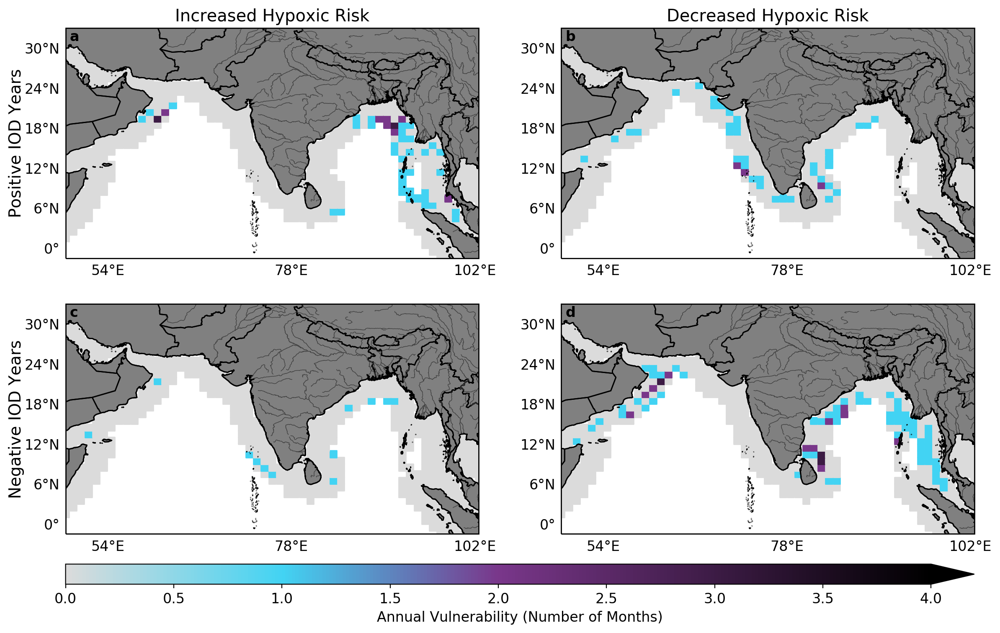

In [32]:
fig = plt.figure(figsize=(14,8),dpi=200)

sz = 35
fsz = 8

cmin = 0 
cmax = 4

# cmap = get_continuous_cmap(['#000000','#7A378B','#42d4f4','#DcDcDc'],
#                            [0,0.25,0.5,1])
cmap = get_continuous_cmap(['#DcDcDc','#42d4f4','#7A378B','#000000'],
                           [0,0.25,0.5,1])
cbounds = [48.5,102.5,-1.5,33]


plt.rcParams.update({'legend.fontsize': 16,
                     'legend.handlelength': 2,
                     "legend.markerscale":2,
                     'font.size': 12})

title = ['Hypoxia Duration','Increased Hypoxic Risk', 'Decreased Hypoxic Risk']
ylabel = ['Positive IOD Years', 'Negative IOD Years']
mon_title = ['dec','jan','feb','mar','apr','may','jun','july','aug','sep','oct','nov']
# mon_title = ['jun','july','aug','sep','oct','nov','dec','jan','feb','mar','apr','may']



xx,yy = np.meshgrid(np.array(ds_WOA.lon),np.array(ds_WOA.lat))

mask = mask_coast(xx.flatten(),yy.flatten(),[35,120,-20,30])
mask.shape

xx = xx.flatten()[mask]
yy = yy.flatten()[mask]

zero_to_hyp_per_tmp = zero_to_hyp_per.flatten()[mask]
fifty_to_hyp_per_tmp = fifty_to_hyp_per.flatten()[mask]
hyp_to_80_per_tmp = hyp_to_80_per.flatten()[mask]

inc_risk_p_tmp = inc_risk_p.flatten()[mask]
inc_risk_n_tmp = inc_risk_n.flatten()[mask]
dec_risk_p_tmp = dec_risk_p.flatten()[mask]
dec_risk_n_tmp = dec_risk_n.flatten()[mask]
##############################################################
ax = fig.add_subplot(221,projection= ccrs.PlateCarree())

ax.scatter(xx,yy,c = inc_risk_p_tmp,marker='s',s= sz,
               cmap=cmap,vmin=cmin,vmax=cmax,transform=ccrs.PlateCarree())
g = add_land(ax, cbounds, countries = True, rivers = True, lakes = True)
g.xlocator = mticker.FixedLocator([54,78,102])
g.xlabel_style = {'size': 12}
g.ylabel_style = {'size': 12}
ax.set_title(title[1])
ax.text(-0.1, 0.5, 'Positive IOD Years', va='bottom', ha='center',
        rotation='vertical', rotation_mode='anchor',
        transform=ax.transAxes, fontsize = 14)
add_letter(ax, 'a')


ax = fig.add_subplot(222,projection= ccrs.PlateCarree())
p = ax.scatter(xx,yy,c = dec_risk_p_tmp,marker='s',s= sz,
               cmap=cmap,vmin=cmin,vmax=cmax,transform=ccrs.PlateCarree())
g = add_land(ax, cbounds, countries = True, rivers = True, lakes = True)
g.xlocator = mticker.FixedLocator([54,78,102])
g.xlabel_style = {'size': 12}
g.ylabel_style = {'size': 12}
ax.set_title(title[2])
add_letter(ax, 'b')

ax = fig.add_subplot(223,projection= ccrs.PlateCarree())
ax.scatter(xx,yy,c = inc_risk_n_tmp,marker='s',s= sz,
               cmap=cmap,vmin=cmin,vmax=cmax,transform=ccrs.PlateCarree())
g = add_land(ax, cbounds, countries = True, rivers = True, lakes = True)
g.xlocator = mticker.FixedLocator([54,78,102])
g.xlabel_style = {'size': 12}
g.ylabel_style = {'size': 12}
ax.text(-0.1, 0.5, 'Negative IOD Years', va='bottom', ha='center',
        rotation='vertical', rotation_mode='anchor',
        transform=ax.transAxes, fontsize = 14)
add_letter(ax, 'c')


ax = fig.add_subplot(224,projection= ccrs.PlateCarree())
p = ax.scatter(xx,yy,c = dec_risk_n_tmp,marker='s',s= sz,
               cmap=cmap,vmin=cmin,vmax=cmax,transform=ccrs.PlateCarree())
g = add_land(ax, cbounds, countries = True, rivers = True, lakes = True)
g.xlocator = mticker.FixedLocator([54,78,102])
g.xlabel_style = {'size': 12}
g.ylabel_style = {'size': 12}
ax.set_ylabel(ylabel[1])
add_letter(ax, 'd')

# cbar_ax = fig.add_axes([0.925, 0.125, 0.015, 0.75])
# cbar2 = fig.colorbar(p,cax=cbar_ax, pad=0.04, extend = 'max')
# cbar2.set_label('Percent of Year')

cbar_ax = fig.add_axes([0.125, 0.05, 0.775, 0.03])
cbar2 = fig.colorbar(p,cax=cbar_ax, pad=0.04, orientation = 'horizontal', extend = 'max')
cbar2.set_label('Annual Vulnerability (Number of Months)')

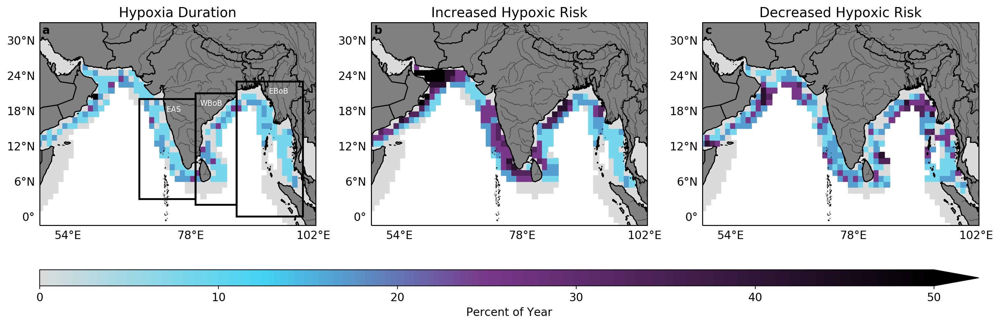

In [186]:
fig = plt.figure(figsize=(18,4),dpi=200)

sz = 35
fsz = 8

cmin = 0 
cmax = 50

# cmap = get_continuous_cmap(['#000000','#7A378B','#42d4f4','#DcDcDc'],
#                            [0,0.25,0.5,1])
cmap = get_continuous_cmap(['#DcDcDc','#42d4f4','#7A378B','#000000'],
                           [0,0.25,0.5,1])
cbounds = [48.5,102.5,-1.5,33]


plt.rcParams.update({'legend.fontsize': 16,
                     'legend.handlelength': 2,
                     "legend.markerscale":2,
                     'font.size': 12})

title = ['Hypoxia Duration','Increased Hypoxic Risk', 'Decreased Hypoxic Risk']
mon_title = ['dec','jan','feb','mar','apr','may','jun','july','aug','sep','oct','nov']
# mon_title = ['jun','july','aug','sep','oct','nov','dec','jan','feb','mar','apr','may']



xx,yy = np.meshgrid(np.array(ds_WOA.lon),np.array(ds_WOA.lat))

mask = mask_coast(xx.flatten(),yy.flatten(),[35,120,-20,30])
mask.shape

xx = xx.flatten()[mask]
yy = yy.flatten()[mask]

zero_to_hyp_per_tmp = zero_to_hyp_per.flatten()[mask]
fifty_to_hyp_per_tmp = fifty_to_hyp_per.flatten()[mask]
hyp_to_80_per_tmp = hyp_to_80_per.flatten()[mask]


##############################################################
ax = fig.add_subplot(131,projection= ccrs.PlateCarree())
p1 = ax.scatter(xx,yy,c = zero_to_hyp_per_tmp,marker='s',s= sz,
               cmap=cmap,vmin=cmin,vmax=cmax,transform=ccrs.PlateCarree())
ax.set_title(title[0])
# AS and BoB Boxes
box_bounds = [bounds_AS,
         bounds_wBoB,
         bounds_BoB]  #lonmin,lonmax, latmin, latmax 
clrs = ['k','k','k']
g = add_land(ax, cbounds, countries = True, rivers = True, lakes = True)
g.xlocator = mticker.FixedLocator([54,78,102])
g.xlabel_style = {'size': 12}
g.ylabel_style = {'size': 12}
add_box(ax,box_bounds,clrs)
add_text(ax, 'EAS', x = 0.46,y=0.56, fontsize = 8, color = 'w')
add_text(ax, 'WBoB', x = 0.58,y=0.59, fontsize = 8, color = 'w')
add_text(ax, 'EBoB', x = 0.83,y=0.65, fontsize = 8, color = 'w')
add_letter(ax, 'a')


ax = fig.add_subplot(132,projection= ccrs.PlateCarree())
ax.scatter(xx,yy,c = fifty_to_hyp_per_tmp,marker='s',s= sz,
               cmap=cmap,vmin=cmin,vmax=cmax,transform=ccrs.PlateCarree())
# ax.scatter(xx[inc_risk_p_tmp],yy[inc_risk_p_tmp],c = var2[inc_risk_p_tmp],marker='s',s= sz+5,hatch = '\\\\\\',
#                       edgecolor='black', linewidth=0,cmap=cmap2,vmin=cmin2,vmax=cmax2,transform=ccrs.PlateCarree())
# ax.scatter(xx[inc_risk_n_tmp],yy[inc_risk_n_tmp],c = var2[inc_risk_n_tmp],marker='s',s= sz+5,hatch = '///',
#                       edgecolor='black', linewidth=0,cmap=cmap2,vmin=cmin2,vmax=cmax2,transform=ccrs.PlateCarree())
# ax.scatter(xx[inc_risk_np_tmp],yy[inc_risk_np_tmp],c = var2[inc_risk_np_tmp],marker='s',s=sz+5,hatch = 'xxx',
#                       edgecolor='black', linewidth=0,cmap=cmap2,vmin=cmin2,vmax=cmax2,transform=ccrs.PlateCarree())
g = add_land(ax, cbounds, countries = True, rivers = True, lakes = True)
g.xlocator = mticker.FixedLocator([54,78,102])
g.xlabel_style = {'size': 12}
g.ylabel_style = {'size': 12}
ax.set_title(title[1])
add_letter(ax, 'b')


ax = fig.add_subplot(133,projection= ccrs.PlateCarree())
p = ax.scatter(xx,yy,c = hyp_to_80_per_tmp,marker='s',s= sz,
               cmap=cmap,vmin=cmin,vmax=cmax,transform=ccrs.PlateCarree())
# ax.scatter(xx[dec_risk_p_tmp],yy[dec_risk_p_tmp],c = var2[dec_risk_p_tmp],marker='s',s= sz+5,hatch = '\\\\\\',
#                       edgecolor='black', linewidth=0,cmap=cmap2,vmin=cmin2,vmax=cmax2,transform=ccrs.PlateCarree())
# ax.scatter(xx[dec_risk_n_tmp],yy[dec_risk_n_tmp],c = var2[dec_risk_n_tmp],marker='s',s= sz+5,hatch = '///',
#                       edgecolor='black', linewidth=0,cmap=cmap2,vmin=cmin2,vmax=cmax2,transform=ccrs.PlateCarree())
# ax.scatter(xx[dec_risk_np_tmp],yy[dec_risk_np_tmp],c = var2[dec_risk_np_tmp],marker='s',s= sz+5,hatch = 'xxx',
#                       edgecolor='black', linewidth=0,cmap=cmap2,vmin=cmin2,vmax=cmax2,transform=ccrs.PlateCarree())
g = add_land(ax, cbounds, countries = True, rivers = True, lakes = True)
g.xlocator = mticker.FixedLocator([54,78,102])
g.xlabel_style = {'size': 12}
g.ylabel_style = {'size': 12}
ax.set_title(title[2])
add_letter(ax, 'c')

import matplotlib.patches as mpatches

# circ1 = mpatches.Patch(facecolor='w',hatch='\\\\\\', label = 'Positive IOD Events')
# circ2 = mpatches.Patch(facecolor='w',hatch='///', label = 'Negative IOD Events')

# plt.legend(handles = [circ1,circ2],loc=3, ncol = 1, fontsize = 10, facecolor = 'lightgrey')

cbar_ax = fig.add_axes([0.125, -0.1, 0.775, 0.06])
cbar2 = fig.colorbar(p,cax=cbar_ax, pad=0.04, orientation = 'horizontal', extend = 'max')
cbar2.set_label('Percent of Year')




# Hypoxia Severity 

In [ ]:
var = ds_WOA.doxy_50_200

#______________________________________________________
# month of lowest oxygen, value of lowest oxygen in shelf waters
#______________________________________________________
mons = np.arange(1,13)

min_mean = np.full([len(ds_WOA.lat),len(ds_WOA.lon)],np.nan)
min_mean_mon = np.full([len(ds_WOA.lat),len(ds_WOA.lon)],np.nan)
min_mean_mon_SLA = np.full([len(ds_WOA.lat),len(ds_WOA.lon)],np.nan)

for ii,jj in itertools.product(np.arange(len(ds_WOA.lat)),np.arange(len(ds_WOA.lon))):
    doxy = var[:,ii,jj]
    
    if np.sum(doxy[np.isfinite(doxy)])>0:
        
        ind = np.nanargmin(doxy)

        min_mean[ii,jj] = doxy[ind]
                
        # shift this one so that you can plot dec first
        if mons[ind] == 12:
            min_mean_mon[ii,jj] = 1
            min_mean_mon_SLA[ii,jj] = mons[ind]
        else:
            min_mean_mon[ii,jj] = mons[ind]+1
            min_mean_mon_SLA[ii,jj] = mons[ind]
            
        if len(doxy[doxy == np.nanmin(doxy)])>1:
                print('Duplicate Values in Minimum.')
                

In [94]:
inc_risk_p = np.full(min_mean_mon_SLA.shape,False)
inc_risk_n = np.full(min_mean_mon_SLA.shape,False)
dec_risk_p = np.full(min_mean_mon_SLA.shape,False)
dec_risk_n = np.full(min_mean_mon_SLA.shape,False)
inc_risk_np = np.full(min_mean_mon_SLA.shape,False)
dec_risk_np = np.full(min_mean_mon_SLA.shape,False)

# find the months of minimum 02 and sign of SLA anomaly
for mm in range(1,13):
    temp_psla = posIOD_mon_sla_mon_anom[mm-1,:,:]
    temp_nsla = negIOD_mon_sla_mon_anom[mm-1,:,:]
    
    # find current month, and make sure sla is negative = upwelling
    ind = (min_mean_mon_SLA == mm) & (temp_psla<0)
    inc_risk_p[ind] = True
    
    # find current month, and make sure sla is positive = downwelling
    ind = (min_mean_mon_SLA == mm) & (temp_psla>0)
    dec_risk_p[ind] = True
    
    
    # find current month, and make sure sla is negative = upwelling
    ind = (min_mean_mon_SLA == mm) & (temp_nsla<0)
    inc_risk_n[ind] = True
    
    # find current month, and make sure sla is positive = downwelling
    ind = (min_mean_mon_SLA == mm) & (temp_nsla>0)
    dec_risk_n[ind] = True
    
    
ind = (inc_risk_n == True) & (inc_risk_p == True)
inc_risk_np[ind] = True

ind = (dec_risk_n == True) & (dec_risk_p == True)
dec_risk_np[ind] = True


# Plot

/home/jennap/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:55: RuntimeWarning: invalid value encountered in less


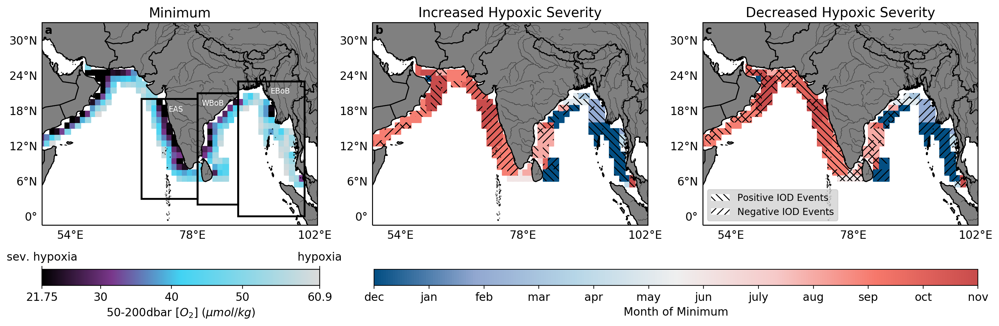

In [122]:
fig = plt.figure(figsize=(18,4),dpi=200)

hypoxic_thres = 60.9
severe_hyp_thres = 21.75
suboxia_thres = 4.35

sz = 35
fsz = 8

cmin1 = severe_hyp_thres
cmax1 = hypoxic_thres

cmin2 = 1
cmax2 = 12

cmap1 = get_continuous_cmap(['#000000','#7A378B','#42d4f4','#DcDcDc'],
                           [0,0.25,0.5,1])
# cmap1 = get_continuous_cmap(['#000000','#7A378B','#42d4f4','#DcDcDc'],
#                            [0,0.3,0.9,1])
cmap2 = get_continuous_cmap(['#034f84','#92a8d1','#b7d7e8','#f0f0f0','#f7cac9','#f7786b','#c94c4c'])

cbounds = [48.5,102.5,-1.5,33]


plt.rcParams.update({'legend.fontsize': 16,
                     'legend.handlelength': 2,
                     "legend.markerscale":2,
                     'font.size': 12})

title = ['Minimum','Increased Hypoxic Severity', 'Decreased Hypoxic Severity']
mon_title = ['dec','jan','feb','mar','apr','may','jun','july','aug','sep','oct','nov']
# mon_title = ['jun','july','aug','sep','oct','nov','dec','jan','feb','mar','apr','may']



xx,yy = np.meshgrid(np.array(ds_WOA.lon),np.array(ds_WOA.lat))

mask = mask_coast(xx.flatten(),yy.flatten(),[35,120,-20,30])
mask.shape

xx = xx.flatten()[mask]
yy = yy.flatten()[mask]

var1 = min_mean.flatten()[mask]
var2 = min_mean_mon.flatten()[mask]
inc_risk_p_tmp = inc_risk_p.flatten()[mask]
inc_risk_n_tmp = inc_risk_n.flatten()[mask]
dec_risk_p_tmp = dec_risk_p.flatten()[mask]
dec_risk_n_tmp = dec_risk_n.flatten()[mask]
dec_risk_np_tmp = dec_risk_np.flatten()[mask]
inc_risk_np_tmp = inc_risk_np.flatten()[mask]

#only keep data that was hypoxic at one month
var_hyp = min_mean.flatten()[mask]
mask_hyp = var_hyp < cmax1

var1 = var1[mask_hyp]
var2 = var2[mask_hyp]
inc_risk_p_tmp = inc_risk_p_tmp[mask_hyp]
inc_risk_n_tmp = inc_risk_n_tmp[mask_hyp]
dec_risk_p_tmp = dec_risk_p_tmp[mask_hyp]
dec_risk_n_tmp = dec_risk_n_tmp[mask_hyp]
inc_risk_np_tmp = inc_risk_np_tmp[mask_hyp]
dec_risk_np_tmp = dec_risk_np_tmp[mask_hyp]
xx = xx[mask_hyp]
yy = yy[mask_hyp]

# hatch data where risk
# hatch_var_piod



##############################################################
ax = fig.add_subplot(131,projection= ccrs.PlateCarree())
p1 = ax.scatter(xx,yy,c = var1,marker='s',s= sz,
               cmap=cmap1,vmin=cmin1,vmax=cmax1,transform=ccrs.PlateCarree())
ax.set_title(title[0])
# AS and BoB Boxes
box_bounds = [bounds_AS,
         bounds_wBoB,
         bounds_BoB]  #lonmin,lonmax, latmin, latmax 
clrs = ['k','k','k']
g = add_land(ax, cbounds, countries = True, rivers = True, lakes = True)
g.xlocator = mticker.FixedLocator([54,78,102])
g.xlabel_style = {'size': 12}
g.ylabel_style = {'size': 12}
add_box(ax,box_bounds,clrs)
add_text(ax, 'EAS', x = 0.46,y=0.56, fontsize = 8, color = 'w')
add_text(ax, 'WBoB', x = 0.58,y=0.59, fontsize = 8, color = 'w')
add_text(ax, 'EBoB', x = 0.83,y=0.65, fontsize = 8, color = 'w')
add_letter(ax, 'a')


ax = fig.add_subplot(132,projection= ccrs.PlateCarree())
ax.scatter(xx,yy,c = var2,marker='s',s= sz,
               cmap=cmap2,vmin=cmin2,vmax=cmax2,transform=ccrs.PlateCarree())
ax.scatter(xx[inc_risk_p_tmp],yy[inc_risk_p_tmp],c = var2[inc_risk_p_tmp],marker='s',s= sz+5,hatch = '\\\\\\',
                      edgecolor='black', linewidth=0,cmap=cmap2,vmin=cmin2,vmax=cmax2,transform=ccrs.PlateCarree())
ax.scatter(xx[inc_risk_n_tmp],yy[inc_risk_n_tmp],c = var2[inc_risk_n_tmp],marker='s',s= sz+5,hatch = '///',
                      edgecolor='black', linewidth=0,cmap=cmap2,vmin=cmin2,vmax=cmax2,transform=ccrs.PlateCarree())
ax.scatter(xx[inc_risk_np_tmp],yy[inc_risk_np_tmp],c = var2[inc_risk_np_tmp],marker='s',s=sz+5,hatch = 'xxx',
                      edgecolor='black', linewidth=0,cmap=cmap2,vmin=cmin2,vmax=cmax2,transform=ccrs.PlateCarree())
g = add_land(ax, cbounds, countries = True, rivers = True, lakes = True)
g.xlocator = mticker.FixedLocator([54,78,102])
g.xlabel_style = {'size': 12}
g.ylabel_style = {'size': 12}
ax.set_title(title[1])
add_letter(ax, 'b')


ax = fig.add_subplot(133,projection= ccrs.PlateCarree())
p2 = ax.scatter(xx,yy,c = var2,marker='s',s= sz,
               cmap=cmap2,vmin=cmin2,vmax=cmax2,transform=ccrs.PlateCarree())
ax.scatter(xx[dec_risk_p_tmp],yy[dec_risk_p_tmp],c = var2[dec_risk_p_tmp],marker='s',s= sz+5,hatch = '\\\\\\',
                      edgecolor='black', linewidth=0,cmap=cmap2,vmin=cmin2,vmax=cmax2,transform=ccrs.PlateCarree())
ax.scatter(xx[dec_risk_n_tmp],yy[dec_risk_n_tmp],c = var2[dec_risk_n_tmp],marker='s',s= sz+5,hatch = '///',
                      edgecolor='black', linewidth=0,cmap=cmap2,vmin=cmin2,vmax=cmax2,transform=ccrs.PlateCarree())
ax.scatter(xx[dec_risk_np_tmp],yy[dec_risk_np_tmp],c = var2[dec_risk_np_tmp],marker='s',s= sz+5,hatch = 'xxx',
                      edgecolor='black', linewidth=0,cmap=cmap2,vmin=cmin2,vmax=cmax2,transform=ccrs.PlateCarree())
g = add_land(ax, cbounds, countries = True, rivers = True, lakes = True)
g.xlocator = mticker.FixedLocator([54,78,102])
g.xlabel_style = {'size': 12}
g.ylabel_style = {'size': 12}
ax.set_title(title[2])
add_letter(ax, 'c')

import matplotlib.patches as mpatches

circ1 = mpatches.Patch(facecolor='w',hatch='\\\\\\', label = 'Positive IOD Events')
circ2 = mpatches.Patch(facecolor='w',hatch='///', label = 'Negative IOD Events')
circ3 = mpatches.Patch(facecolor='w',hatch='xxx', label = 'Negative IOD Events')

plt.legend(handles = [circ1,circ2],loc=3, ncol = 1, fontsize = 10, facecolor = 'lightgrey')


cbar_ax = fig.add_axes([0.125, -0.1, 0.23, 0.06])
cbar_ax2 = cbar_ax.twiny()
# cbar = fig.colorbar(p1,cax=cbar_ax, pad=0.04, orientation = 'horizontal',
#                    ticks = [4.35,21.75,60.9])
# cbar.set_ticklabels(['suboxia','sev. hypoxia','hypoxia'])
cbar = fig.colorbar(p1,cax=cbar_ax, pad=0.04, orientation = 'horizontal',
                   ticks = [21.75,30,40,50,60.9])
cbar.set_ticklabels(['21.75','30','40','50','60.9'])
cbar_ax2.set_xticks([0,1])
cbar_ax2.set_xticklabels(['sev. hypoxia','hypoxia'])
# cbar.ax.xaxis.set_ticks_position("top")
cbar.set_label('50-200dbar [$O_2$] ($\mu mol/ kg$)')


cbar_ax = fig.add_axes([0.4, -0.1, 0.5, 0.06])
cbar2 = fig.colorbar(p2,cax=cbar_ax, pad=0.04, orientation = 'horizontal',ticks = np.arange(1,13))
# cbar2.ax.xaxis.set_ticks_position("top")
cbar2.set_label('Month of Minimum')
cbar2.set_ticklabels(mon_title)



/home/jennap/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in less


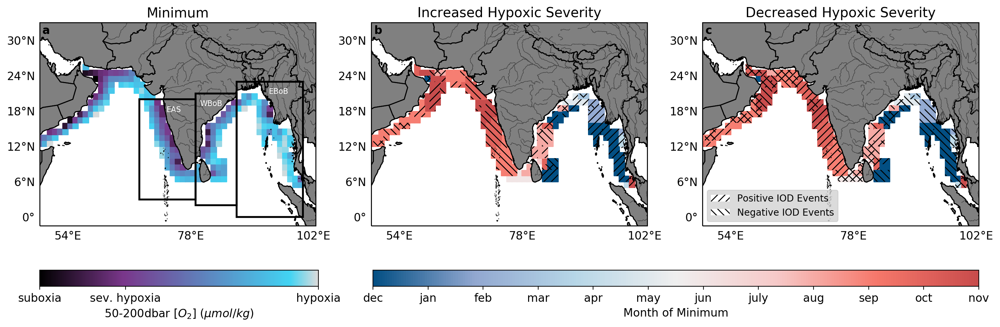

In [115]:
fig = plt.figure(figsize=(18,4),dpi=200)

hypoxic_thres = 60.9
severe_hyp_thres = 21.75
suboxia_thres = 4.35

sz = 35
fsz = 8

cmin1 = suboxia_thres
cmax1 = hypoxic_thres

cmin2 = 1
cmax2 = 12

# cmap1 = get_continuous_cmap(['#622569','#622569','#b8a9c9','#588c7e'],
#                            [0,0.59,0.65, 1]),'#DcDcDc'
cmap1 = get_continuous_cmap(['#000000','#7A378B','#42d4f4','#DcDcDc'],
                           [0,0.3,0.9,1])
# [0,0.35,0.8,1])
cmap2 = get_continuous_cmap(['#034f84','#92a8d1','#b7d7e8','#f0f0f0','#f7cac9','#f7786b','#c94c4c'])
# cmap2 = get_continuous_cmap(['#c94c4c','#f7786b','#f7cac9','#f0f0f0','#b7d7e8','#92a8d1','#034f84'])
# cmap2 = plt.cm.jet

# cbounds = [45,100,0,30]
cbounds = [48.5,102.5,-1.5,33]


plt.rcParams.update({'legend.fontsize': 16,
                     'legend.handlelength': 2,
                     "legend.markerscale":2,
                     'font.size': 12})

title = ['Minimum','Increased Hypoxic Severity', 'Decreased Hypoxic Severity']
mon_title = ['dec','jan','feb','mar','apr','may','jun','july','aug','sep','oct','nov']
# mon_title = ['jun','july','aug','sep','oct','nov','dec','jan','feb','mar','apr','may']



xx,yy = np.meshgrid(np.array(ds_WOA.lon),np.array(ds_WOA.lat))

mask = mask_coast(xx.flatten(),yy.flatten(),[35,120,-20,30])
mask.shape

xx = xx.flatten()[mask]
yy = yy.flatten()[mask]

var1 = min_mean.flatten()[mask]
var2 = min_mean_mon.flatten()[mask]
inc_risk_p_tmp = inc_risk_p.flatten()[mask]
inc_risk_n_tmp = inc_risk_n.flatten()[mask]
dec_risk_p_tmp = dec_risk_p.flatten()[mask]
dec_risk_n_tmp = dec_risk_n.flatten()[mask]
dec_risk_np_tmp = dec_risk_np.flatten()[mask]
inc_risk_np_tmp = inc_risk_np.flatten()[mask]

#only keep data that was hypoxic at one month
var_hyp = min_mean.flatten()[mask]
mask_hyp = var_hyp < cmax1

var1 = var1[mask_hyp]
var2 = var2[mask_hyp]
inc_risk_p_tmp = inc_risk_p_tmp[mask_hyp]
inc_risk_n_tmp = inc_risk_n_tmp[mask_hyp]
dec_risk_p_tmp = dec_risk_p_tmp[mask_hyp]
dec_risk_n_tmp = dec_risk_n_tmp[mask_hyp]
inc_risk_np_tmp = inc_risk_np_tmp[mask_hyp]
dec_risk_np_tmp = dec_risk_np_tmp[mask_hyp]
xx = xx[mask_hyp]
yy = yy[mask_hyp]

# hatch data where risk
# hatch_var_piod



##############################################################
ax = fig.add_subplot(131,projection= ccrs.PlateCarree())
p1 = ax.scatter(xx,yy,c = var1,marker='s',s= sz,
               cmap=cmap1,vmin=cmin1,vmax=cmax1,transform=ccrs.PlateCarree())
ax.set_title(title[0])
# AS and BoB Boxes
box_bounds = [bounds_AS,
         bounds_wBoB,
         bounds_BoB]  #lonmin,lonmax, latmin, latmax 
clrs = ['k','k','k']
g = add_land(ax, cbounds, countries = True, rivers = True, lakes = True)
g.xlocator = mticker.FixedLocator([54,78,102])
g.xlabel_style = {'size': 12}
g.ylabel_style = {'size': 12}
add_box(ax,box_bounds,clrs)
add_text(ax, 'EAS', x = 0.46,y=0.56, fontsize = 8, color = 'w')
add_text(ax, 'WBoB', x = 0.58,y=0.59, fontsize = 8, color = 'w')
add_text(ax, 'EBoB', x = 0.83,y=0.65, fontsize = 8, color = 'w')
add_letter(ax, 'a')


ax = fig.add_subplot(132,projection= ccrs.PlateCarree())
ax.scatter(xx,yy,c = var2,marker='s',s= sz,
               cmap=cmap2,vmin=cmin2,vmax=cmax2,transform=ccrs.PlateCarree())
ax.scatter(xx[inc_risk_p_tmp],yy[inc_risk_p_tmp],c = var2[inc_risk_p_tmp],marker='s',s= sz+5,hatch = '///',
                      edgecolor='black', linewidth=0,cmap=cmap2,vmin=cmin2,vmax=cmax2,transform=ccrs.PlateCarree())
ax.scatter(xx[inc_risk_n_tmp],yy[inc_risk_n_tmp],c = var2[inc_risk_n_tmp],marker='s',s= sz+5,hatch = '\\\\\\',
                      edgecolor='black', linewidth=0,cmap=cmap2,vmin=cmin2,vmax=cmax2,transform=ccrs.PlateCarree())
ax.scatter(xx[inc_risk_np_tmp],yy[inc_risk_np_tmp],c = var2[inc_risk_np_tmp],marker='s',s=sz+5,hatch = 'xxx',
                      edgecolor='black', linewidth=0,cmap=cmap2,vmin=cmin2,vmax=cmax2,transform=ccrs.PlateCarree())
g = add_land(ax, cbounds, countries = True, rivers = True, lakes = True)
g.xlocator = mticker.FixedLocator([54,78,102])
g.xlabel_style = {'size': 12}
g.ylabel_style = {'size': 12}
ax.set_title(title[1])
add_letter(ax, 'b')


ax = fig.add_subplot(133,projection= ccrs.PlateCarree())
p2 = ax.scatter(xx,yy,c = var2,marker='s',s= sz,
               cmap=cmap2,vmin=cmin2,vmax=cmax2,transform=ccrs.PlateCarree())
ax.scatter(xx[dec_risk_p_tmp],yy[dec_risk_p_tmp],c = var2[dec_risk_p_tmp],marker='s',s= sz+5,hatch = '///',
                      edgecolor='black', linewidth=0,cmap=cmap2,vmin=cmin2,vmax=cmax2,transform=ccrs.PlateCarree())
ax.scatter(xx[dec_risk_n_tmp],yy[dec_risk_n_tmp],c = var2[dec_risk_n_tmp],marker='s',s= sz+5,hatch = '\\\\\\',
                      edgecolor='black', linewidth=0,cmap=cmap2,vmin=cmin2,vmax=cmax2,transform=ccrs.PlateCarree())
ax.scatter(xx[dec_risk_np_tmp],yy[dec_risk_np_tmp],c = var2[dec_risk_np_tmp],marker='s',s= sz+5,hatch = 'xxx',
                      edgecolor='black', linewidth=0,cmap=cmap2,vmin=cmin2,vmax=cmax2,transform=ccrs.PlateCarree())
g = add_land(ax, cbounds, countries = True, rivers = True, lakes = True)
g.xlocator = mticker.FixedLocator([54,78,102])
g.xlabel_style = {'size': 12}
g.ylabel_style = {'size': 12}
ax.set_title(title[2])
add_letter(ax, 'c')

import matplotlib.patches as mpatches

circ1 = mpatches.Patch(facecolor='w',hatch='///', label = 'Positive IOD Events')
circ2 = mpatches.Patch(facecolor='w',hatch='\\\\\\', label = 'Negative IOD Events')
circ3 = mpatches.Patch(facecolor='w',hatch='xxx', label = 'Negative IOD Events')

plt.legend(handles = [circ1,circ2],loc=3, ncol = 1, fontsize = 10, facecolor = 'lightgrey')


cbar_ax = fig.add_axes([0.125, -0.1, 0.23, 0.06])
cbar = fig.colorbar(p1,cax=cbar_ax, pad=0.04, orientation = 'horizontal',
                   ticks = [4.35,21.75,60.9])
cbar.set_ticklabels(['suboxia','sev. hypoxia','hypoxia'])
# cbar.ax.xaxis.set_ticks_position("top")
cbar.set_label('50-200dbar [$O_2$] ($\mu mol/ kg$)')


cbar_ax = fig.add_axes([0.4, -0.1, 0.5, 0.06])
cbar2 = fig.colorbar(p2,cax=cbar_ax, pad=0.04, orientation = 'horizontal',ticks = np.arange(1,13))
# cbar2.ax.xaxis.set_ticks_position("top")
cbar2.set_label('Month of Minimum')
cbar2.set_ticklabels(mon_title)




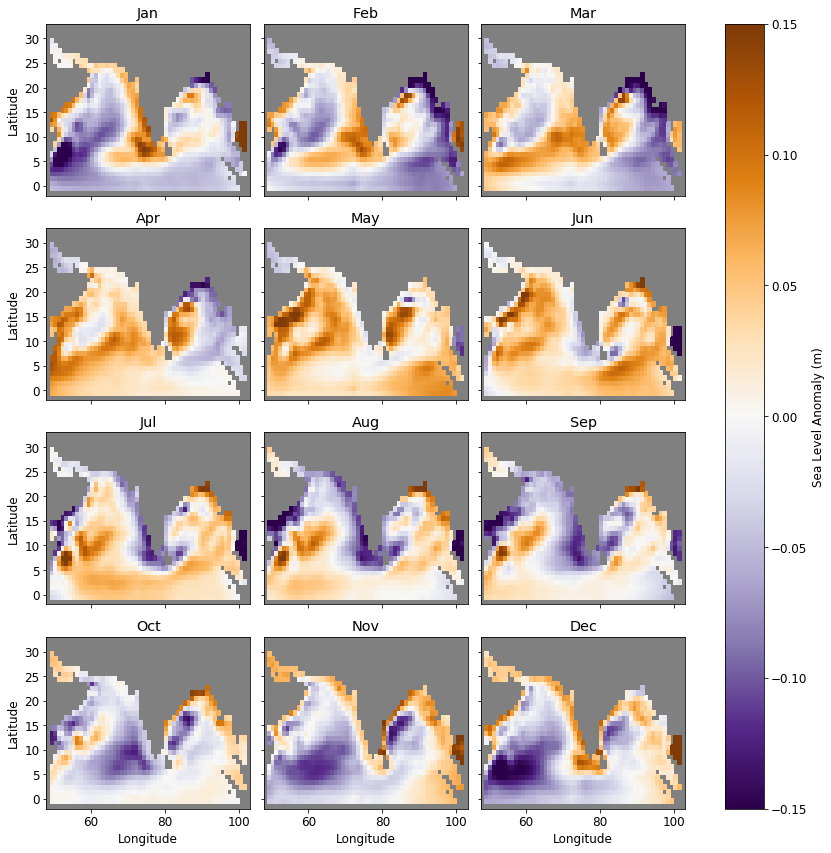

In [70]:
# posIOD
months = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']

p = ds_SLA.mon_sla_mon_clim.plot.pcolormesh(x="lon", y="lat", col="month", col_wrap=3,
                                        cmap="PuOr_r",
                                        vmax=0.15,vmin=-0.15, # set colorbar lims
                                        extend = 'neither', # make a box colorbar rather than pointed
                                        figsize = (12, 12),
                                        cbar_kwargs={"label": "Sea Level Anomaly (m)"},
                                        subplot_kws={'facecolor': 'gray'}
                                       )

for i, ax in enumerate(p.axes.flat):
    ax.set_title(months[i])
    ax.axes.axis('tight')
#     plt.subplots_adjust(top=.9)

p.set_xlabels('Longitude')
p.set_ylabels('Latitude')

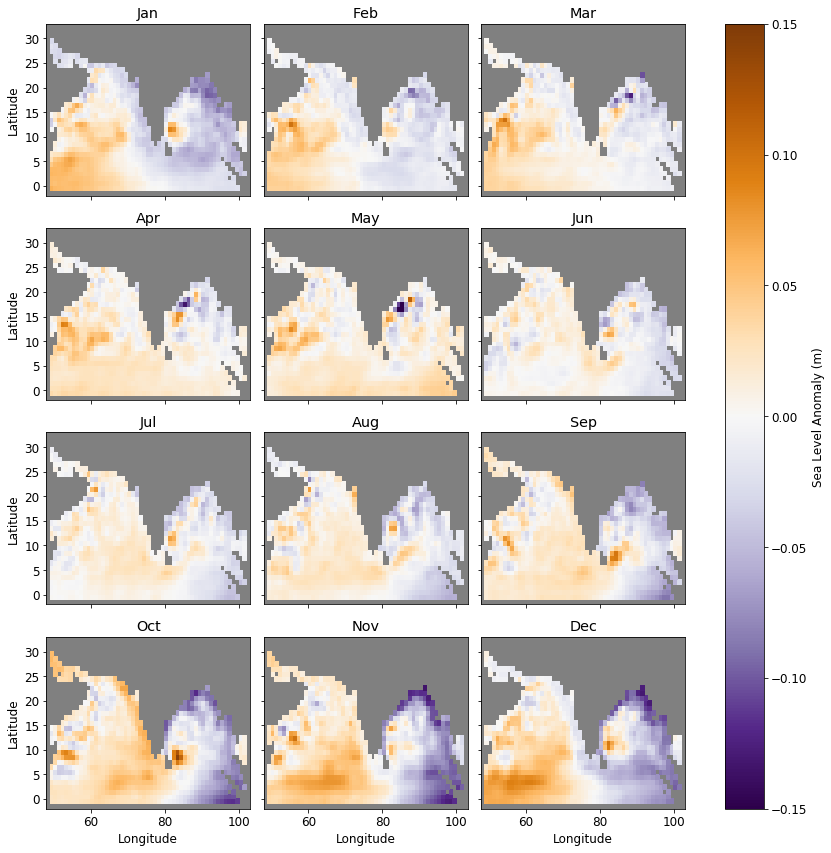

In [69]:
# posIOD
months = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']

p = posIOD_mon_sla_mon_anom.plot.pcolormesh(x="lon", y="lat", col="month", col_wrap=3,
                                        cmap="PuOr_r",
                                        vmax=0.15,vmin=-0.15, # set colorbar lims
                                        extend = 'neither', # make a box colorbar rather than pointed
                                        figsize = (12, 12),
                                        cbar_kwargs={"label": "Sea Level Anomaly (m)"},
                                        subplot_kws={'facecolor': 'gray'}
                                       )

for i, ax in enumerate(p.axes.flat):
    ax.set_title(months[i])
    ax.axes.axis('tight')
#     plt.subplots_adjust(top=.9)

p.set_xlabels('Longitude')
p.set_ylabels('Latitude')

/home/jennap/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:56: RuntimeWarning: invalid value encountered in less


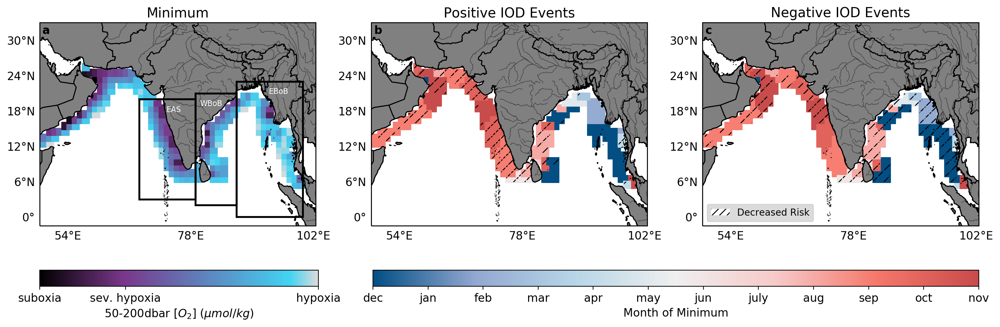

In [48]:
fig = plt.figure(figsize=(18,4),dpi=200)

hypoxic_thres = 60.9
severe_hyp_thres = 21.75
suboxia_thres = 4.35

sz = 60
fsz = 8

cmin1 = suboxia_thres
cmax1 = hypoxic_thres

cmin2 = 1
cmax2 = 12

# cmap1 = get_continuous_cmap(['#622569','#622569','#b8a9c9','#588c7e'],
#                            [0,0.59,0.65, 1]),'#DcDcDc'
cmap1 = get_continuous_cmap(['#000000','#7A378B','#42d4f4','#DcDcDc'],
                           [0,0.3,0.9,1])
# [0,0.35,0.8,1])
cmap2 = get_continuous_cmap(['#034f84','#92a8d1','#b7d7e8','#f0f0f0','#f7cac9','#f7786b','#c94c4c'])
# cmap2 = get_continuous_cmap(['#c94c4c','#f7786b','#f7cac9','#f0f0f0','#b7d7e8','#92a8d1','#034f84'])


# cbounds = [45,100,0,30]
cbounds = [48.5,102.5,-1.5,33]


plt.rcParams.update({'legend.fontsize': 16,
                     'legend.handlelength': 2,
                     "legend.markerscale":2,
                     'font.size': 12})

title = ['Minimum','Positive IOD Events', 'Negative IOD Events']
mon_title = ['dec','jan','feb','mar','apr','may','jun','july','aug','sep','oct','nov']
# mon_title = ['jun','july','aug','sep','oct','nov','dec','jan','feb','mar','apr','may']


xx,yy = np.meshgrid(np.array(ds_WOA.lon),np.array(ds_WOA.lat))

mask = mask_coast(xx.flatten(),yy.flatten(),[35,120,-20,30])
mask.shape

xx = xx.flatten()[mask]
yy = yy.flatten()[mask]

var1 = min_mean.flatten()[mask]
var2 = min_mean_mon.flatten()[mask]
inc_risk_p_tmp = inc_risk_p.flatten()[mask]
inc_risk_n_tmp = inc_risk_n.flatten()[mask]
dec_risk_p_tmp = dec_risk_p.flatten()[mask]
dec_risk_n_tmp = dec_risk_n.flatten()[mask]

#only keep data that was hypoxic at one month
var_hyp = min_mean.flatten()[mask]
mask_hyp = var_hyp < cmax1

var1 = var1[mask_hyp]
var2 = var2[mask_hyp]
inc_risk_p_tmp = inc_risk_p_tmp[mask_hyp]
inc_risk_n_tmp = inc_risk_n_tmp[mask_hyp]
dec_risk_p_tmp = dec_risk_p_tmp[mask_hyp]
dec_risk_n_tmp = dec_risk_n_tmp[mask_hyp]
xx = xx[mask_hyp]
yy = yy[mask_hyp]

# hatch data where risk
# hatch_var_piod



##############################################################
ax = fig.add_subplot(131,projection= ccrs.PlateCarree())
p1 = ax.scatter(xx,yy,c = var1,marker='s',s= sz,
               cmap=cmap1,vmin=cmin1,vmax=cmax1,transform=ccrs.PlateCarree())
ax.set_title(title[0])
# AS and BoB Boxes
box_bounds = [bounds_AS,
         bounds_wBoB,
         bounds_BoB]  #lonmin,lonmax, latmin, latmax 
clrs = ['k','k','k']
g = add_land(ax, cbounds, countries = True, rivers = True, lakes = True)
g.xlocator = mticker.FixedLocator([54,78,102])
g.xlabel_style = {'size': 12}
g.ylabel_style = {'size': 12}
add_box(ax,box_bounds,clrs)
add_text(ax, 'EAS', x = 0.46,y=0.56, fontsize = 8, color = 'w')
add_text(ax, 'WBoB', x = 0.58,y=0.59, fontsize = 8, color = 'w')
add_text(ax, 'EBoB', x = 0.83,y=0.65, fontsize = 8, color = 'w')
add_letter(ax, 'a')


ax = fig.add_subplot(132,projection= ccrs.PlateCarree())
ax.scatter(xx,yy,c = var2,marker='s',s= sz,
               cmap=cmap2,vmin=cmin2,vmax=cmax2,transform=ccrs.PlateCarree())
ax.scatter(xx[dec_risk_p_tmp],yy[dec_risk_p_tmp],c = var2[dec_risk_p_tmp],marker='s',s= sz,hatch = '//',
                      cmap=cmap2,vmin=cmin2,vmax=cmax2,transform=ccrs.PlateCarree())
g = add_land(ax, cbounds, countries = True, rivers = True, lakes = True)
g.xlocator = mticker.FixedLocator([54,78,102])
g.xlabel_style = {'size': 12}
g.ylabel_style = {'size': 12}
ax.set_title(title[1])
add_letter(ax, 'b')


ax = fig.add_subplot(133,projection= ccrs.PlateCarree())
p2 = ax.scatter(xx,yy,c = var2,marker='s',s= sz,
               cmap=cmap2,vmin=cmin2,vmax=cmax2,transform=ccrs.PlateCarree())
ax.scatter(xx[dec_risk_n_tmp],yy[dec_risk_n_tmp],c = var2[dec_risk_n_tmp],marker='s',s= sz,hatch = '//',
                      cmap=cmap2,vmin=cmin2,vmax=cmax2,transform=ccrs.PlateCarree())
g = add_land(ax, cbounds, countries = True, rivers = True, lakes = True)
g.xlocator = mticker.FixedLocator([54,78,102])
g.xlabel_style = {'size': 12}
g.ylabel_style = {'size': 12}
ax.set_title(title[2])
add_letter(ax, 'c')

import matplotlib.patches as mpatches

circ1 = mpatches.Patch(facecolor='w',hatch='///', label = 'Decreased Risk')

plt.legend(handles = [circ1],loc=3, ncol = 1, fontsize = 10, facecolor = 'lightgrey')


cbar_ax = fig.add_axes([0.125, -0.1, 0.23, 0.06])
cbar = fig.colorbar(p1,cax=cbar_ax, pad=0.04, orientation = 'horizontal',
                   ticks = [4.35,21.75,60.9])
cbar.set_ticklabels(['suboxia','sev. hypoxia','hypoxia'])
# cbar.ax.xaxis.set_ticks_position("top")
cbar.set_label('50-200dbar [$O_2$] ($\mu mol/ kg$)')


cbar_ax = fig.add_axes([0.4, -0.1, 0.5, 0.06])
cbar2 = fig.colorbar(p2,cax=cbar_ax, pad=0.04, orientation = 'horizontal',ticks = np.arange(1,13))
# cbar2.ax.xaxis.set_ticks_position("top")
cbar2.set_label('Month of Minimum')
cbar2.set_ticklabels(mon_title)




In [50]:
var = seasonal_mean
ann_mean = np.array(ann_mean)

fig, axes = plt.subplots(nrows = 2, ncols = 2,figsize=(14,7),dpi=200,subplot_kw={'projection': ccrs.PlateCarree()})
sz = 60

cmap = get_continuous_cmap(['#622569','#622569','#b8a9c9','#588c7e'],
                           [0,0.59,0.65, 1])
cmin = 0
cmax = 100

xx,yy = np.meshgrid(ds_WOA.lon,ds_WOA.lat)
xx = xx.flatten()[mask]
yy = yy.flatten()[mask]

plt.rcParams.update({'font.size': 14})
season_title = ['Annual Mean', 'Summer/Fall', 'Winter/Spring']

levels = np.linspace(-0.15,0.15,10)

cbounds = [45,100,0,30]


##############################################################

ax = axes[0,0]
tmp = var[0,:,:]
tmp = tmp.flatten()
p = ax.scatter(xx,yy,c = tmp[mask],marker='s',s= sz,
                      cmap=cmap,vmin=cmin,vmax=cmax,transform=ccrs.PlateCarree())

hatch_mask = np.full(min_mean.shape,1)
hatch_mask = hatch_mask.flatten()[mask]

ax.scatter(xx[hatch_mask],yy[hatch_mask],c = tmp[hatch_mask],marker='s',s= sz,hatch = '//',
                      cmap=cmap,vmin=cmin,vmax=cmax,transform=ccrs.PlateCarree())

ax.set_title(season_title[1])
ax.text(-0.15, 0.5, 'Positive IOD Years', va='bottom', ha='center',
        rotation='vertical', rotation_mode='anchor',
        transform=ax.transAxes, fontsize = 18)
add_land(ax, cbounds)
add_letter(ax, 'a', x = 0.01, y = .93)

ax = axes[0,1]

tmp = var[1,:,:]
tmp = tmp.flatten()
p = ax.scatter(xx,yy,c = tmp[mask],marker='s',s= sz,
                      cmap=cmap,vmin=cmin,vmax=cmax,transform=ccrs.PlateCarree())
add_land(ax, cbounds)
add_letter(ax, 'b', x = 0.01, y = .93)

ax.set_title(season_title[2])

ax = axes[1,0]
tmp = var[0,:,:]
tmp = tmp.flatten()
p = ax.scatter(xx,yy,c = tmp[mask],marker='s',s= sz,
                      cmap=cmap,vmin=cmin,vmax=cmax,transform=ccrs.PlateCarree())
ax.text(-0.15, 0.5, 'Negative IOD Years', va='bottom', ha='center',
        rotation='vertical', rotation_mode='anchor',
        transform=ax.transAxes, fontsize = 18)
add_land(ax, cbounds)
add_letter(ax, 'c', x = 0.01, y = .93)

ax = axes[1,1]

tmp = var[1,:,:]
tmp = tmp.flatten()
p = ax.scatter(xx,yy,c = tmp[mask],marker='s',s= sz,
                      cmap=cmap,vmin=cmin,vmax=cmax,transform=ccrs.PlateCarree())
add_land(ax, cbounds)
add_letter(ax, 'd', x = 0.01, y = .93)




neg = plt.Line2D((0, 1), (0, 0), color='k', linestyle='--', linewidth=2)
pos = plt.Line2D((0, 1), (0, 0), color='k', linestyle='-', linewidth=2)

# l = plt.legend([neg,pos],['upwelling', 'downwelling'],facecolor = 'w')
# plt.setp(l.get_texts(), color='w');

cbar_ax = fig.add_axes([0.13, -0.05, 0.75, 0.04])
cbar_anom = fig.colorbar(p,cax=cbar_ax, pad=0.04, orientation = 'horizontal', extend = 'both')
cbar_anom.set_label('50-200dbar [$O_2$] ($\mu mol/ kg$)')




NameError: name 'seasonal_mean' is not defined

/home/jennap/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: invalid value encountered in less


IndexError: boolean index did not match indexed array along dimension 0; dimension is 221 but corresponding boolean dimension is 460

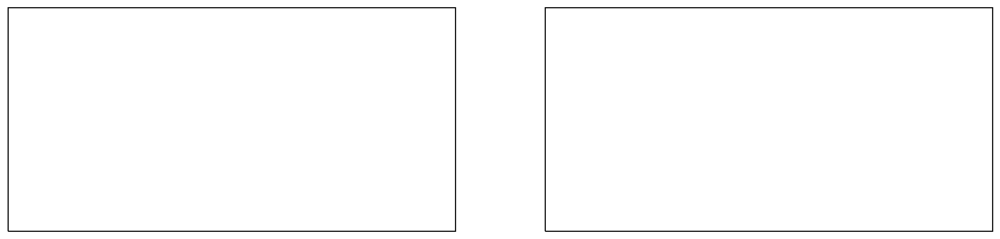

In [37]:
fig, axes = plt.subplots(nrows = 1, ncols = 2,figsize=(16,4),dpi=200,subplot_kw={'projection': ccrs.PlateCarree()})
sz = 60

cmin1 = 0
cmax1 = 100

cmin2 = 1
cmax2 = 12

cmap1 = get_continuous_cmap(['#622569','#622569','#b8a9c9','#588c7e'],
                           [0,0.59,0.65, 1])
cmap2 = get_continuous_cmap(['#034f84','#92a8d1','#b7d7e8','#f0f0f0','#f7cac9','#f7786b','#c94c4c'])

cbounds = [45,100,0,30]


# plt.rcParams.update({'legend.fontsize': 16,
#                      'legend.handlelength': 2,
#                      "legend.markerscale":2,
#                      'font.size': 12})

title = ['Increased Hypoxic Risk', 'Decreased Hypoxic Risk']
mon_title = ['dec','jan','feb','mar','apr','may','jun','july','aug','sep','oct','nov']

var = min_mean_mon.flatten()[mask]

#only keep data that was hypoxic at one month
hatch_var_hyp = min_mean.flatten()[mask]
hatch_mask_hyp = hatch_var_hyp < 63

var = var[hatch_mask_hyp]
xx = xx[hatch_mask_hyp]
yy = yy[hatch_mask_hyp]

# hatch data where risk
# hatch_var_piod



##############################################################

ax = axes[0]
ax.scatter(xx,yy,c = var,marker='s',s= sz,
               cmap=cmap2,vmin=cmin2,vmax=cmax2,transform=ccrs.PlateCarree())
add_land(ax, cbounds)
ax.set_title(title[0])
add_letter(ax, 'a', x = 0.01, y = .925)


ax = axes[1]
p2 = ax.scatter(xx,yy,c = var,marker='s',s= sz,
               cmap=cmap2,vmin=cmin2,vmax=cmax2,transform=ccrs.PlateCarree())
add_land(ax, cbounds)
ax.set_title(title[1])
add_letter(ax, 'b', x = 0.01, y = .925)

cbar_ax = fig.add_axes([0.13, -0.1, 0.75, 0.07])
cbar2 = fig.colorbar(p2,cax=cbar_ax, pad=0.04, orientation = 'horizontal', extend = 'both',ticks = np.arange(1,13))
cbar2.set_label('Month of Minimum 50-200dbar [$O_2$]')
cbar2.set_ticklabels(mon_title)




In [ ]:
var1 = min_mean
var2 = min_mean_mon
fig, axes = plt.subplots(nrows = 1, ncols = 2,figsize=(16,6),dpi=200,subplot_kw={'projection': ccrs.PlateCarree()})
sz = 60

cmin1 = 0
cmax1 = 200

cmin2 = 1
cmax2 = 12

cmap1 = get_continuous_cmap(['#622569','#622569','#b8a9c9','#588c7e'],
                           [0,0.59,0.65, 1])
cmap2 = get_continuous_cmap(['#034f84','#92a8d1','#b7d7e8','#f0f0f0','#f7cac9','#f7786b','#c94c4c'])

cbounds = [45,100,0,30]


xx,yy = np.meshgrid(ds_WOA.lon,ds_WOA.lat)
xx = xx.flatten()
yy = yy.flatten()

# plt.rcParams.update({'legend.fontsize': 16,
#                      'legend.handlelength': 2,
#                      "legend.markerscale":2,
#                      'font.size': 12})

title = ['Minimum','Month of Minimum']
mon_title = ['dec','jan','feb','mar','apr','may','jun','july','aug','sep','oct','nov']
##############################################################

ax = axes[0]
tmp = var1.flatten()
p = ax.scatter(xx[mask],yy[mask],c = tmp[mask],marker='s',s= sz,
               cmap=cmap1,vmin=cmin1,vmax=cmax1,transform=ccrs.PlateCarree())
ax.set_title(title[0])
add_land(ax, cbounds)
add_letter(ax, 'a', x = 0.01, y = .93)

cbar = plt.colorbar(p, ax = ax,orientation='horizontal', extend= 'max',
                   ticks = np.arange(0,120,20))
cbar.set_ticklabels(['0','20','40', 'hypoxia', '80','100'])
cbar.set_label('50-200dbar [$O_2$] ($\mu mol/ kg$)')

ax = axes[1]
tmp = var2.flatten()

p = ax.scatter(xx[mask],yy[mask],c = tmp[mask],marker='s',s= sz,
               cmap=cmap2,vmin=cmin2,vmax=cmax2,transform=ccrs.PlateCarree())
    
cbar2 = plt.colorbar(p, ax = ax,orientation='horizontal', extend= 'both',
                    ticks = np.arange(1,13))
cbar2.set_ticklabels(mon_title)
add_land(ax, cbounds)
ax.set_title(title[1])
add_letter(ax, 'b', x = 0.01, y = .925)

IndexError: boolean index did not match indexed array along dimension 0; dimension is 221 but corresponding boolean dimension is 1925

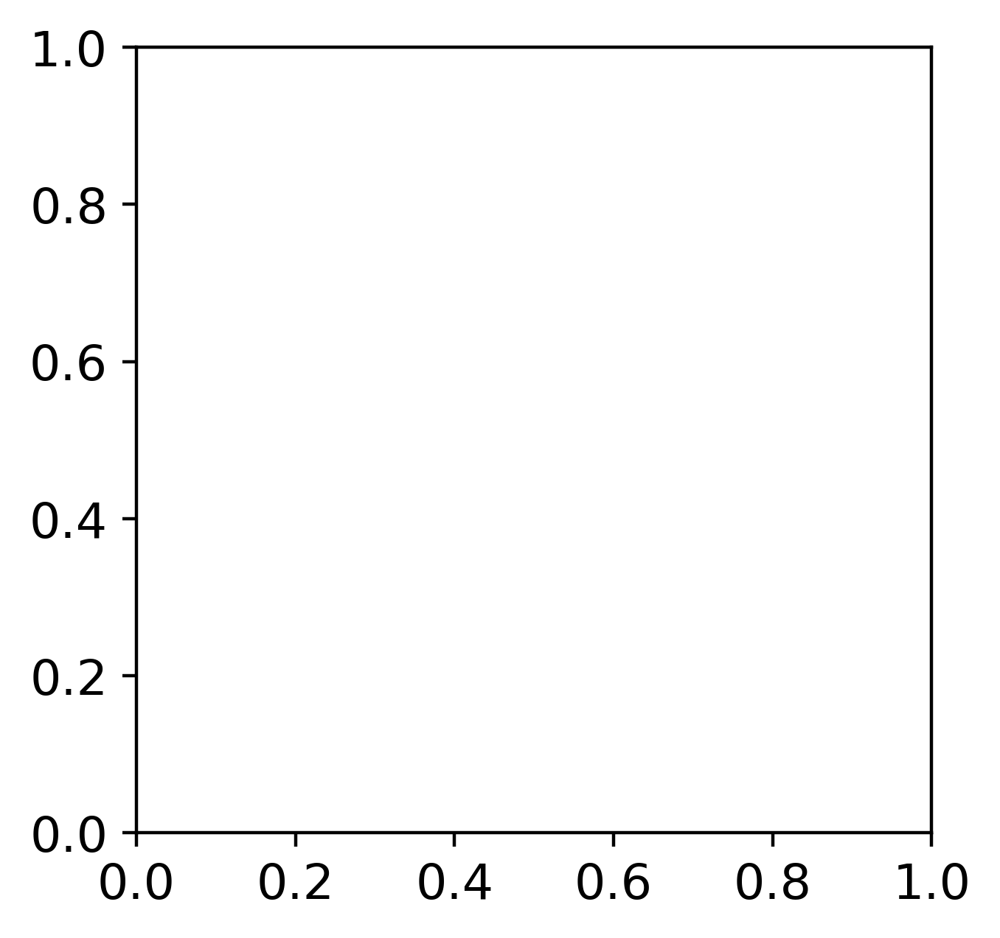

In [49]:
var = np.array(ds_WOA.doxy_50_200)

fig = plt.figure(figsize=(16, 12), dpi=400)
months = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']
cmap = get_continuous_cmap(['#622569','#622569','#b8a9c9','#588c7e','#c94c4c'],
                           [0,0.5,0.65, 0.85,1])   
cmin = 0
cmax = 120
for tt in range(1,13):
    tmp = var[tt-1,:,:]
    tmp = tmp.flatten()
    ax = fig.add_subplot(3,4,tt)
    p = ax.scatter(xx[mask],yy[mask],c = tmp[mask],marker='s',s= sz,
                      cmap=cmap,vmin=cmin,vmax=cmax)
    ax.set_title(months[tt-1])
plt.colorbar(p)

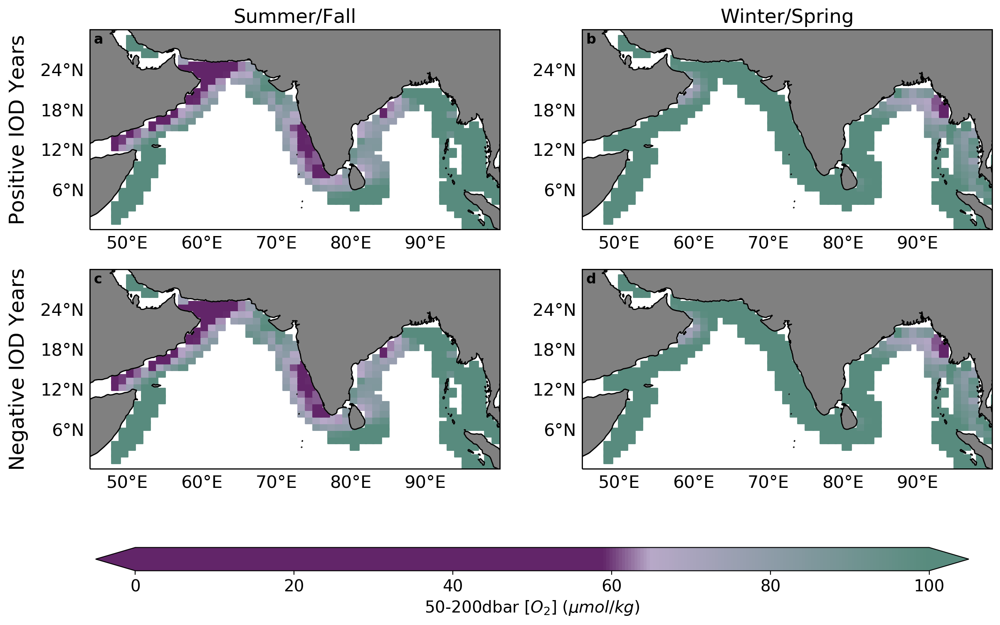

In [36]:
var = seasonal_mean
ann_mean = np.array(ann_mean)

fig, axes = plt.subplots(nrows = 2, ncols = 2,figsize=(14,7),dpi=200,subplot_kw={'projection': ccrs.PlateCarree()})
sz = 60

cmap = get_continuous_cmap(['#622569','#622569','#b8a9c9','#588c7e'],
                           [0,0.59,0.65, 1])
cmin = 0
cmax = 100

xx,yy = np.meshgrid(ds_WOA.lon,ds_WOA.lat)
xx = xx.flatten()[mask]
yy = yy.flatten()[mask]

plt.rcParams.update({'font.size': 14})
season_title = ['Annual Mean', 'Summer/Fall', 'Winter/Spring']

levels = np.linspace(-0.15,0.15,10)

cbounds = [45,100,0,30]


##############################################################

ax = axes[0,0]
tmp = var[0,:,:]
tmp = tmp.flatten()
p = ax.scatter(xx,yy,c = tmp[mask],marker='s',s= sz,
                      cmap=cmap,vmin=cmin,vmax=cmax,transform=ccrs.PlateCarree())

hatch_mask = np.full(min_mean.shape,1)
hatch_mask = hatch_mask.flatten()[mask]

ax.scatter(xx[hatch_mask],yy[hatch_mask],c = tmp[hatch_mask],marker='s',s= sz,hatch = '//',
                      cmap=cmap,vmin=cmin,vmax=cmax,transform=ccrs.PlateCarree())

ax.set_title(season_title[1])
ax.text(-0.15, 0.5, 'Positive IOD Years', va='bottom', ha='center',
        rotation='vertical', rotation_mode='anchor',
        transform=ax.transAxes, fontsize = 18)
add_land(ax, cbounds)
add_letter(ax, 'a', x = 0.01, y = .93)

ax = axes[0,1]

tmp = var[1,:,:]
tmp = tmp.flatten()
p = ax.scatter(xx,yy,c = tmp[mask],marker='s',s= sz,
                      cmap=cmap,vmin=cmin,vmax=cmax,transform=ccrs.PlateCarree())
add_land(ax, cbounds)
add_letter(ax, 'b', x = 0.01, y = .93)

ax.set_title(season_title[2])

ax = axes[1,0]
tmp = var[0,:,:]
tmp = tmp.flatten()
p = ax.scatter(xx,yy,c = tmp[mask],marker='s',s= sz,
                      cmap=cmap,vmin=cmin,vmax=cmax,transform=ccrs.PlateCarree())
ax.text(-0.15, 0.5, 'Negative IOD Years', va='bottom', ha='center',
        rotation='vertical', rotation_mode='anchor',
        transform=ax.transAxes, fontsize = 18)
add_land(ax, cbounds)
add_letter(ax, 'c', x = 0.01, y = .93)

ax = axes[1,1]

tmp = var[1,:,:]
tmp = tmp.flatten()
p = ax.scatter(xx,yy,c = tmp[mask],marker='s',s= sz,
                      cmap=cmap,vmin=cmin,vmax=cmax,transform=ccrs.PlateCarree())
add_land(ax, cbounds)
add_letter(ax, 'd', x = 0.01, y = .93)




neg = plt.Line2D((0, 1), (0, 0), color='k', linestyle='--', linewidth=2)
pos = plt.Line2D((0, 1), (0, 0), color='k', linestyle='-', linewidth=2)

# l = plt.legend([neg,pos],['upwelling', 'downwelling'],facecolor = 'w')
# plt.setp(l.get_texts(), color='w');

cbar_ax = fig.add_axes([0.13, -0.05, 0.75, 0.04])
cbar_anom = fig.colorbar(p,cax=cbar_ax, pad=0.04, orientation = 'horizontal', extend = 'both')
cbar_anom.set_label('50-200dbar [$O_2$] ($\mu mol/ kg$)')

